<center><strong><span style="font-family:AppleMyungjo, sans-serif;font-size: 25px;">CQF Exam 2(Module 3)</span></strong></center>
<center><strong>LANG TAO, WANG</strong></center>
<center><strong>January 2024</strong></center>

## 1.   Introdution

  Use the expected value of the discounted payoff under the risk-neutral density $\mathbb{Q} $

$$ V(S;t)=e^{-(T-t)}E^{\mathbb{Q}}[\mathbf{Payoff}(S_T)] $$

for the appropriate form of payoff, to consider **Asian** and **lookback** options.

Use the **Euler-Maruyama (only)** scheme for initially simulating the underlying stock price. As an initial
example you may use the following set of sample data:

$$ \begin{align}
   Today's \quad stock \quad price \quad S0 \quad& = \quad100 \\
   Strike \quad E \quad & = \quad 100 \\
   Time \quad to \quad  expiry \quad (T - t)\quad & = \quad 1 \quad year \\
   volatility \quad \sigma  \quad& =\quad 20 \% \\
   constant\quad  risk-free \quad  interest \quad  rate\quad r \quad & =\quad 5 \% \\
   \end{align}
$$


Then vary the data to see the affect on the option price.

## 2. Monte Carlo Approach

Monte Carlo methods are any process that consumes random numbers. These are part of computational algorithms which are based on random sampling to obtain numerical results.These methods are widely used in high dimensional problems; pricing exotics and complex derivatives where closed form solutions are not directly available.

### 2.1 Option Pricing Method

The fair value of an option in the Black-Scholes world is present value of the expected payoff at expiry under a risk-neutral random walk for the underlying.

The pricing algorithm by following these simple steps:

1. Simulate the risk-neutral random walk starting today's value of the asset over the required time horizon. This gives one realization of underlying price path.

2. For this realization calculate the option payoff.

3. Perform many more such realization over the time horizon.

4. Calculate the average payoff over all realization.

5. Take the present value of this average, this is the option value

**Advantages of Monte Carlo pricing**

(1) It is esay to code.

(2) It is hard to make mistakes in the coding.

**Disadvantages of Monte Carlo pricing**

(1) More work is needed to get the greeks.

(2) It can be slow since tens of thousands of simulations are needed to get an accurate answers.

### 2.2 Generating Paths

Following Black-Scholes-Merton where the underlying follows under risk neutrality, a geometric Brownian motion with a stochastic differential equation (SDE) is given as:

$$ dS_t = rS_tdt+\sigma S_t dW_t $$

where $S_t$ is the underlying price at time t, $\sigma$ is the constant volatility, r is the constant risk-free interest rate and W is the brownian motion.

An obvious choice is to use :

$$ \delta S = rS \delta t + \sigma S \sqrt{\delta t} \phi $$

$$ S_{t+\delta t} = S_t \ast (1 + r \delta t + \sigma \sqrt{\delta t} \phi) $$

where $\phi$ is drawn from a standardized Normal distribution. This discrete way of simulating the time series for S is called the **Euler method**.

For the lognormal random walk we are lucky that we can find a simple, and exact, time stepping algorithm. We can write the risk-neutral stochastic differential equation for S in the form :

$$ d(log S) = (r - \frac{1}{2}\sigma ^2) dt + \sigma dX $$

This can be integrated exactly to give :

$$ S(t) = S(0) exp \left( (r - \frac{1}{2} \sigma ^2) t + \sigma \int_{0}^{t} dX \right)$$

Or, over a time step $\delta t$.

$$ S(t+\delta t) = S(t) + \delta S = S(t) exp \left((r- \frac{1}{2}\sigma ^2)\delta t + \sigma \sqrt{\delta t} \phi \right)$$

For the stochastic volatiltity, we suppose that a geometic Brownian motion with a stochastic differential equation(SDE) is given as :

$$ d\sigma _t = \mu dt+\mathbf{(std)} \sigma _t dW_t $$

Applying Euler discretization of SDE, we get :

$$ \sigma _{t+\delta t} = \sigma _t \ast (1 + \mu \delta t + \mathbf{(std)} \sqrt{\delta t} \phi) $$

where $\sigma _t$ is the volatility at time t. $\mu$ is constant mean of volatility, **std** is the constant standard deviation of volatility and $\phi$ is the random number for standardized Normal distribution.

#### Import Required Libraries

In [256]:
# Importing libraries
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import itertools
from IPython.core.display import display, Markdown
import cufflinks as cf
cf.set_config_file(offline=True, dimensions=((1000,600)))
import plotly.express as px
px.defaults.width, px.defaults.height = 1000,600
# Set precision
pd.set_option('display.precision', 6)

In [257]:
class MC:
    ''' Monte Carlo simulated option value '''

    def __init__(self, S0: float, E: float, r: float, T: int, sigma: float, process: str='lognormal',
                 mu: float=0.0, std: float=0, D: float=0.0, ts: int=252, num: int=10000) -> float:

        self.S0 = S0                               # Initial stock value
        self.E = E                                 # Strike price
        self.rate = r                              # risk-free rate
        self.expiry = T                            # Time to expiration
        self.vol = sigma                           # Volatility
        self.pros = process                        # default is lognormal process, other is normal and stochastic volatility
        self.mu = mu                               # The mean of stochastic volatility
        self.std = std                             # The standard deviation of stochastic volatility        
        self.D = D                                 # Dividends
        self.ts = ts                               # Time steps
        self.num = num                             # Number of simulations
        
    @property
    def mc_sim_path_lognormal(self):
        ''' Monte Carlo simulated price path -- lognormal process'''
        np.random.seed(104)
    
        # define delta_t
        delta_t = self.expiry/self.ts
        
        # Simulate the time series for S
        S = np.zeros((self.ts, self.num))
        S[0] = self.S0
    
        for i in range(0, self.ts-1):
            
            # generate psuedo random number( a standardized normal distribution)
            phi = np.random.standard_normal(self.num)
            
            S[i+1] = S[i] * np.exp((self.rate-self.D-0.5*(self.vol**2))*delta_t + self.vol*np.sqrt(delta_t)*phi)
    
        return S 

    @property
    def mc_sim_path_normal(self):
        ''' Monte Carlo simulated price path -- normal process'''
        np.random.seed(104)
    
        # define delta_t
        delta_t = self.expiry/self.ts
        
        # Simulate the time series for S
        S = np.zeros((self.ts, self.num))
        S[0] = self.S0
    
        for i in range(0, self.ts-1):
            
            # generate psuedo random number( a standardized normal distribution)
            phi = np.random.standard_normal(self.num)
            
            S[i+1] = S[i] * (1 + (self.rate-self.D)*delta_t + self.vol*np.sqrt(delta_t)*phi)

        return S

    @property
    def mc_sim_path_sto_vol(self):
        ''' Monte Carlo simulated price path -- lognormal process and stochastic volatility'''
        np.random.seed(104)

        vol_path = MCvolatility(self.vol, self.mu, self.expiry, self.std, self.ts, self.num).mc_sim_vol
    
        # define delta_t
        delta_t = self.expiry/self.ts
        
        # Simulate the time series for S
        S = np.zeros((self.ts, self.num))
        S[0] = self.S0
    
        for i in range(0, self.ts-1):
            
            # generate psuedo random number( a standardized normal distribution)
            phi = np.random.standard_normal(self.num)
            
            S[i + 1] = S[i] * np.exp((self.rate-0.5*(vol_path[i]**2))*delta_t + vol_path[i]*np.sqrt(delta_t)*phi)

        return S

    @property 
    def mc_sim_path(self):
        ''' Select prcess for price path '''
        
        if self.pros == 'lognormal':
            asset_path = self.mc_sim_path_lognormal
            
        elif self.pros == 'normal':
            asset_path = self.mc_sim_path_normal
            
        elif self.pros == 'stochastic volatility':
            asset_path = self.mc_sim_path_sto_vol

        return asset_path

    ''' Asian option '''
    
    # Calculate average 
    def updating_rule(self, sample):
        
        # initilize the A matrix
        A = np.zeros(sample.shape)
        A[0] = sample[0]
            
        for i in range(1, sample.shape[0]):
            A[i] = (i/(i+1))* A[i-1] + sample[i]/(i+1)

        return A
        
    def arithmetic(self, array):
        return self.updating_rule(array)

    def geometric(self, array):

        sample_g = np.log(array)
        update = np.exp(self.updating_rule(sample_g))

        return update

    def average(self, mode='continuous', run='arithmetic', rolling=5):
        ''' Calculate continuously or discretely sampled average '''

        price = self.mc_sim_path
        
        if mode == 'continuous':

            if run == 'arithmetic':
                ave = self.arithmetic(price)

            elif run == 'geometric':
                ave = self.geometric(price)
        

        elif mode == 'discrete':

            price_dis = price[::rolling]
            
            if run == 'arithmetic':
                ave = self.arithmetic(price_dis)

            elif run == 'geometric':
                ave = self.geometric(price_dis)
                
            ave = np.repeat(ave, rolling, axis=0)
            
        return ave

    # The value of asian option
    def asian_option(self, select: dict={'style': 'rate', 'mode': 'continuous', 'method': 'arithmetic', 'rolling': 5}, t=0):
        ''' Calculate Asian option for average rate or strike, 
            the classification is arithmetic or geometric '''

        price = self.mc_sim_path
        remian = self.expiry - t

        # The mean of price 
        mean = self.average(select['mode'], select['method'], select['rolling'])
        
        # The classification of payoff
        if select['style'] == 'rate':
            
            # Payoff for average rate and present value                
            asian_call = np.exp(-self.rate*remian)*np.mean(np.maximum(0, mean[-1]-self.E))
            asian_put = np.exp(-self.rate*remian)*np.mean(np.maximum(0, self.E-mean[-1]))
        
        elif select['style'] == 'strike':
            
            # Payoff for average strike and present value                
            asian_call = np.exp(-self.rate*remian)*np.mean(np.maximum(0, price[-1]-mean[-1]))
            asian_put = np.exp(-self.rate*remian)*np.mean(np.maximum(0, mean[-1]-price[-1]))
            
        return [asian_call, asian_put]

    ''' Lookback Option '''

    # Updating rule
    def updating(self, array, value='maximum'):

        # Initialize the M matrix
        M = np.zeros(array.shape)
        M[0] = array[0]

        if value == 'maximum':
            
            for i in range(1, M.shape[0]):
                M[i] = np.maximum(M[i-1], array[i])
                
        elif value == 'minimum':

            for i in range(1, M.shape[0]):
                M[i] = np.minimum(M[i-1], array[i])

        return M
            
    # Query maximum for continuous
    def continuous_max(self, asarray):
        return self.updating(asarray, 'maximum')

    # Query minimum for continuous
    def continuous_min(self, asarray):
        return self.updating(asarray, 'minimum')

    # Query discreted maximum or minimum
    def discrete_max_min(self, asarray, value_style='maximum', rolling=5):
        
        dis = asarray[::rolling]
        
        if value_style == 'maximum':
            final_m = self.updating(dis, value_style)

        elif value_style == 'minimum':
            final_m = self.updating(dis, value_style)

        final_m = np.repeat(final_m, rolling, axis=0)

        return final_m

    # The value of lookback option
    def lookback_option(self, select: dict={'style': 'fixed', 'mode': 'continuous', 'rolling': 5}, t=0):
        ''' Calculate lookback option '''

        price = self.mc_sim_path
        remian = self.expiry - t

        #lookback_call, lookback_put = np.zeros(self.ts), np.zeros(self.ts)

        #The maximum and minimum of price
        if select['mode'] == 'continuous':
            
            price_max = self.continuous_max(price)
            price_min = self.continuous_min(price)

        elif select['mode'] == 'discrete':

            price_max = self.discrete_max_min(price, 'maximum', select['rolling'])
            price_min = self.discrete_max_min(price, 'minimum', select['rolling'])

        # The classification of payoff
        if select['style'] == 'fixed':
            
            # Payoff for lookback option and present value
            lookback_call = np.exp(-self.rate*remian)*np.mean(np.maximum(0, price_max[-1]-self.E))
            lookback_put = np.exp(-self.rate*remian)*np.mean(np.maximum(0, self.E-price_min[-1]))
        
        elif select['style'] == 'floating':

            # Payoff for lookback option and present value
            lookback_call = np.exp(-self.rate*remian)*np.mean(np.maximum(0, price[-1]-price_min[-1]))
            lookback_put = np.exp(-self.rate*remian)*np.mean(np.maximum(0, price_max[-1]-price[-1]))

        return [lookback_call, lookback_put]


class MCvolatility:
    ''' Monte Carlo the simulated Volatility '''

    def __init__(self, sigma0: float, mu: float, T: int, std: float, ts: int=252, num: int=10000) -> float:

        self.sigma0 = sigma0                               # Initial volatility value
        self.mu = mu                                       # mean
        self.T = T                                         # Time to expiration
        self.std = std                                     # Standard deviation
        self.ts = ts                                       # Time steps
        self.num = num                                     # Number of simulations

    @property
    def mc_sim_vol(self):
        ''' Monte Carlo simulated volatility path '''
        np.random.seed(104)
    
        # define delta_t
        delta_t = self.T/self.ts
        
        # Simulate the time series for S
        V = np.zeros((self.ts, self.num))
        V[0] = self.sigma0
    
        for i in range(0, self.ts-1):
            
            # generate psuedo random number( a standardized normal distribution)
            phi = np.random.standard_normal(self.num)
            
            V[i+1] = V[i] * (1 + self.mu*delta_t+self.std*np.sqrt(delta_t)*phi)
    
        return V 

    @property 
    def vol_average(self):

        vol_path = self.mc_sim_vol

        vol_ave = np.zeros(vol_path.shape)
        vol_ave[0] = vol_path[0]

        for i in range(1, vol_ave.shape[0]):
            vol_ave[i] = vol_path[:i+1].mean(axis=0)

        return np.mean(vol_ave, axis=1)


class Greeks(MC):
    ''' Calculate the Greeks '''

    def __init__(self, S0: float, E: float, r: float, T: int, sigma: float, option: str, select: dict, 
                process: str, mu: float, std: float, D: float, ts: int, num: int)-> float:

        super().__init__(S0, E, r, T, sigma, process, mu, std, D, ts, num)
        
        self.option = option
        self.select = select

        
    def delta(self,ds=0.01):
        ''' Calculate the delta '''

        price_up = MC(self.S0+ds, self.E, self.rate, self.expiry, self.vol, self.pros,self.mu, 
                          self.std, self.D, self.ts, self.num)
        price_down = MC(self.S0-ds, self.E, self.rate, self.expiry, self.vol, self.pros,self.mu, 
                          self.std, self.D, self.ts, self.num)
        
        if self.option == 'asian':            
            option_up = price_up.asian_option(self.select)
            option_down = price_down.asian_option(self.select)

        elif self.option == 'lookback':
            option_up = price_up.lookback_option(self.select)
            option_down = price_down.lookback_option(self.select) 

        # The central difference
        call_delta = 0.5*(option_up[0] - option_down[0])/ds
        put_delta = 0.5*(option_up[1] - option_down[1])/ds

        return [call_delta, put_delta]

    def gamma(self, ds=0.01):
        ''' Calculate the gamma '''

        price_up = MC(self.S0+ds, self.E, self.rate, self.expiry, self.vol, self.pros,self.mu, 
                          self.std, self.D, self.ts, self.num)
        price_flat = MC(self.S0, self.E, self.rate, self.expiry, self.vol, self.pros,self.mu, 
                          self.std, self.D, self.ts, self.num)
        price_down = MC(self.S0-ds, self.E, self.rate, self.expiry, self.vol, self.pros,self.mu, 
                          self.std, self.D, self.ts, self.num)
        
        if self.option == 'asian':            
            option_up = price_up.asian_option(self.select)
            option_flat = price_flat.asian_option(self.select)
            option_down = price_down.asian_option(self.select)

        elif self.option == 'lookback':
            option_up = price_up.lookback_option(self.select)
            option_flat = price_flat.lookback_option(self.select)
            option_down = price_down.lookback_option(self.select) 

        # The first forward or backward difference and central difference
        call_gamma = (option_up[0]-2*option_flat[0]+option_down[0])/(ds**2)
        put_gamma = (option_up[1]-2*option_flat[1]+option_down[1])/(ds**2)

        return [call_gamma, put_gamma]

    def vega(self, dsigma=0.01):
        ''' Calculate the vega'''

        price_up = MC(self.S0, self.E, self.rate, self.expiry, self.vol+dsigma, self.pros,self.mu, 
                          self.std, self.D, self.ts, self.num)
        price_down = MC(self.S0, self.E, self.rate, self.expiry, self.vol-dsigma, self.pros,self.mu, 
                          self.std, self.D, self.ts, self.num)
        
        if self.option == 'asian':            
            option_up = price_up.asian_option(self.select)
            option_down = price_down.asian_option(self.select)

        elif self.option == 'lookback':
            option_up = price_up.lookback_option(self.select)
            option_down = price_down.lookback_option(self.select) 

        # The central difference
        call_vega = 0.5*(option_up[0] - option_down[0])/dsigma
        put_vega = 0.5*(option_up[1] - option_down[1])/dsigma

        return [call_vega, put_vega]

    def rho(self, dr=0.01):
        ''' Calculate the rho '''
        
        price_up = MC(self.S0, self.E, self.rate+dr, self.expiry, self.vol, self.pros,self.mu, 
                          self.std, self.D, self.ts, self.num)
        price_down = MC(self.S0, self.E, self.rate-dr, self.expiry, self.vol, self.pros,self.mu, 
                          self.std, self.D, self.ts, self.num)
        
        if self.option == 'asian':            
            option_up = price_up.asian_option(self.select)
            option_down = price_down.asian_option(self.select)

        elif self.option == 'lookback':
            option_up = price_up.lookback_option(self.select)
            option_down = price_down.lookback_option(self.select) 

        # The central difference
        call_rho = 0.5*(option_up[0] - option_down[0])/dr
        put_rho = 0.5*(option_up[1] - option_down[1])/dr

        return [call_rho, put_rho]


    def asian_theta(self, t=0.0,dt=0.01):
        ''' Calculate the theta for asian option '''
        
        if t == 0.0:
            # The forward difference
            price_up= MC(self.S0, self.E, self.rate, self.expiry-t-dt, self.vol, self.pros,self.mu, 
                         self.std, self.D, self.ts, self.num)
            price_down = MC(self.S0, self.E, self.rate, self.expiry-t, self.vol, self.pros,self.mu, 
                            self.std, self.D, self.ts, self.num)
            
               
            option_up = price_up.asian_option(self.select, t+dt)
            option_down = price_down.asian_option(self.select, t)
            
            call_theta = (option_up[0] - option_down[0])/dt
            put_theta = (option_up[1] - option_down[1])/dt

        else:
            if t != self.expiry:
                # the central difference
                price_up= MC(self.S0, self.E, self.rate, self.expiry-t-dt, self.vol, self.pros,self.mu, 
                            self.std, self.D, self.ts, self.num)
                price_down = MC(self.S0, self.E, self.rate, self.expiry-t+dt, self.vol, self.pros,self.mu, 
                                self.std, self.D, self.ts, self.num)
                
                   
                option_up = price_up.asian_option(self.select, t+dt)
                option_down = price_down.asian_option(self.select, t-dt)

                call_theta = 0.5*(option_up[0] - option_down[0])/dt
                put_theta = 0.5*(option_up[1] - option_down[1])/dt

            else:
                # The backward difference
                price_up= MC(self.S0, self.E, self.rate, self.expiry-t, self.vol, self.pros,self.mu, 
                                        self.std, self.D, self.ts, self.num)
                price_down = MC(self.S0, self.E, self.rate, self.expiry-t+dt, self.vol, self.pros,self.mu, 
                                        self.std, self.D, self.ts, self.num)
                
                   
                option_up = price_up.asian_option(self.select, t)
                option_down = price_down.asian_option(self.select, t-dt)

                call_theta = (option_up[0] - option_down[0])/dt
                put_theta = (option_up[1] - option_down[1])/dt

        return [call_theta, put_theta]


    def lookback_theta(self, t=0.0,dt=0.01):
        ''' Calculate the theta for asian option '''
        
        if t == 0.0:
            # The forward difference
            price_up= MC(self.S0, self.E, self.rate, self.expiry-t-dt, self.vol, self.pros,self.mu, 
                         self.std, self.D, self.ts, self.num)
            price_down = MC(self.S0, self.E, self.rate, self.expiry-t, self.vol, self.pros,self.mu, 
                            self.std, self.D, self.ts, self.num)
            
               
            option_up = price_up.lookback_option(self.select, t+dt)
            option_down = price_down.lookback_option(self.select, t)
            
            call_theta = (option_up[0] - option_down[0])/dt
            put_theta = (option_up[1] - option_down[1])/dt

        else:
            if t != self.expiry:
                # the central difference
                price_up= MC(self.S0, self.E, self.rate, self.expiry-t-dt, self.vol, self.pros,self.mu, 
                            self.std, self.D, self.ts, self.num)
                price_down = MC(self.S0, self.E, self.rate, self.expiry-t+dt, self.vol, self.pros,self.mu, 
                                self.std, self.D, self.ts, self.num)
                
                   
                option_up = price_up.lookback_option(self.select, t+dt)
                option_down = price_down.lookback_option(self.select, t-dt)

                call_theta = 0.5*(option_up[0] - option_down[0])/dt
                put_theta = 0.5*(option_up[1] - option_down[1])/dt

            else:
                # The backward difference
                price_up= MC(self.S0, self.E, self.rate, self.expiry-t, self.vol, self.pros,self.mu, 
                                        self.std, self.D, self.ts, self.num)
                price_down = MC(self.S0, self.E, self.rate, self.expiry-t+dt, self.vol, self.pros,self.mu, 
                                        self.std, self.D, self.ts, self.num)
                
                   
                option_up = price_up.lookback_option(self.select, t)
                option_down = price_down.lookback_option(self.select, t-dt)

                call_theta = (option_up[0] - option_down[0])/dt
                put_theta = (option_up[1] - option_down[1])/dt

        return [call_theta, put_theta]

**Lognormal random walk**

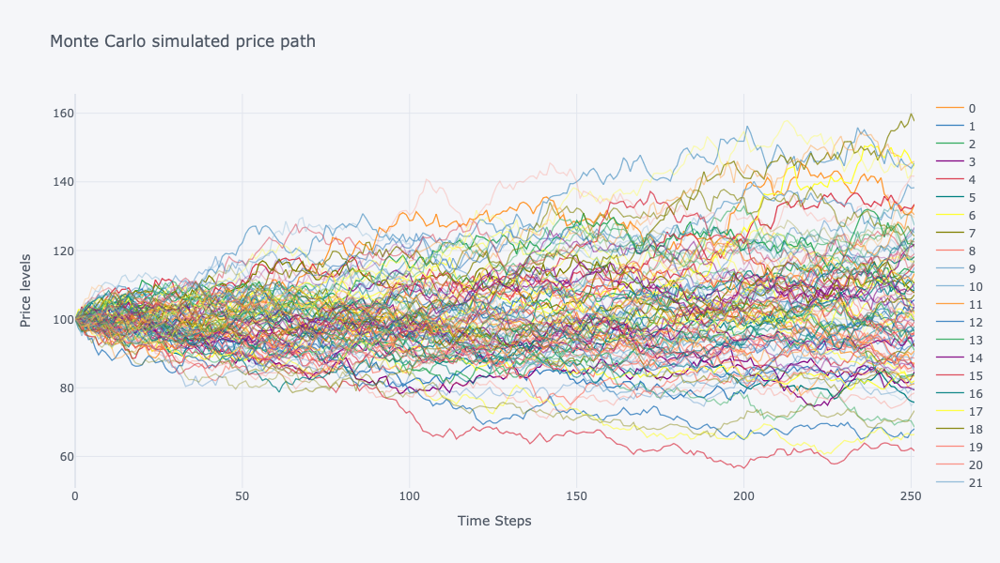

In [258]:
# Instantiation
ex1 = MC(100, 100, 0.05, 1, 0.2)

# plot price path
price_path1 = pd.DataFrame(ex1.mc_sim_path)
price_path1.iloc[:, :100].iplot(kind='line', title='Monte Carlo simulated price path', xTitle='Time Steps', yTitle='Price levels')

**Normal random walk**

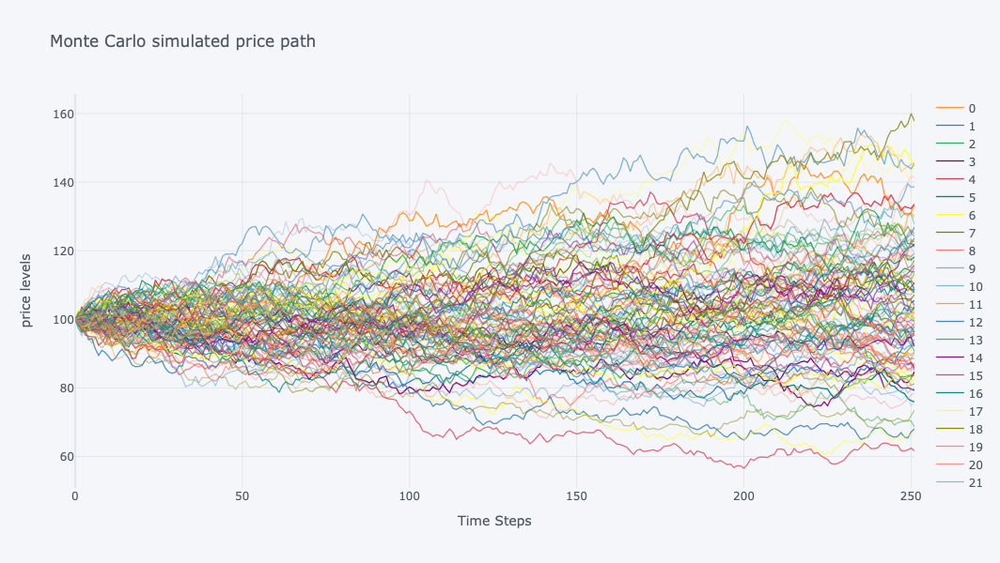

In [259]:
# Instantiation
ex2 = MC(100, 100, 0.05, 1, 0.2, 'normal')

# plot price path
price_path2 = pd.DataFrame(ex2.mc_sim_path)
price_path2.iloc[:, :100].iplot(kind='line', title='Monte Carlo simulated price path', xTitle='Time Steps', yTitle='price levels')

**Stochastic Volatility**

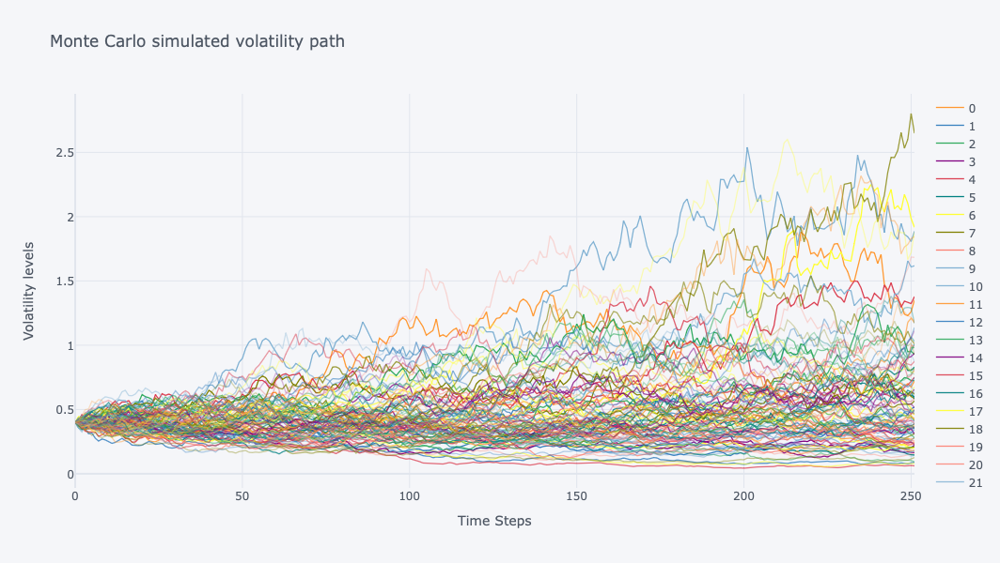

In [260]:
# Instantiation
# paremeter setting
# sigma0 = 0.4, mu=0.5, time to expiry=1, std=0.8)
# plot volatility path

vol_path = pd.DataFrame(MCvolatility(0.4, 0.5, 1, 0.8).mc_sim_vol)
vol_path.iloc[:, :100].iplot(kind='line', title='Monte Carlo simulated volatility path', xTitle='Time Steps', yTitle='Volatility levels')

**Lognormal random walk and stochastic volatiltity**

Algorithm method: according to the stochastic volatility hyperthesis, take a grid, index is time steps, columns is the path; every number is associated with grid for the price path(lognormal random walk).

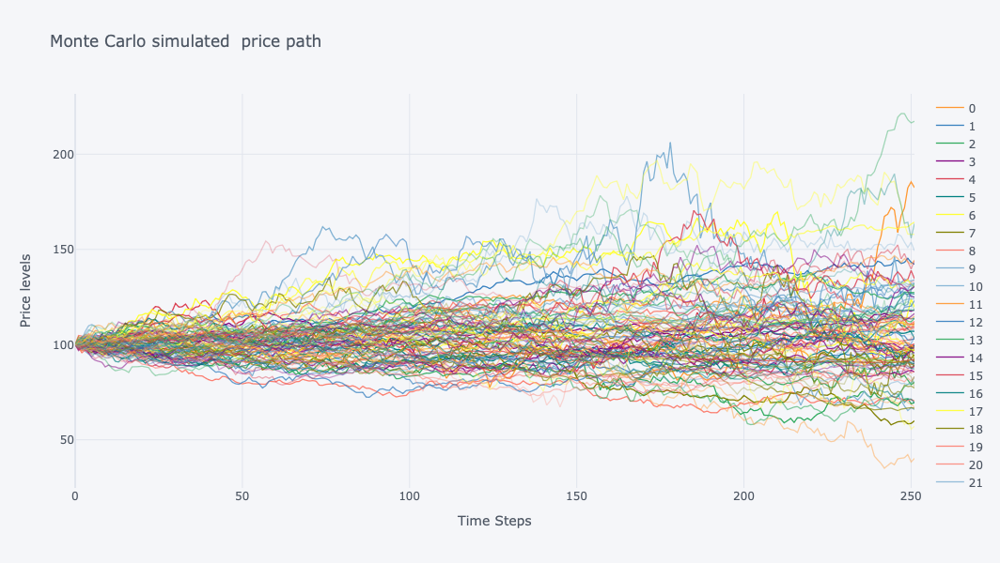

In [261]:
# Instantiation
ex3 = MC(100, 100, 0.05, 1, 0.2, 'stochastic volatility', 0.4, 0.7)

# plot price path
price_path3 = pd.DataFrame(ex3.mc_sim_path)
price_path3.iloc[:, :100].iplot(kind='line', title='Monte Carlo simulated  price path', xTitle='Time Steps', yTitle='Price levels')

## 2. Risk-Neutral Valuation

### 2.1.1 Asian Option

Asian option give the holder a payoff that depends on the average price of underlying over some prescribed period.

**Payoff Types**

There is the classification of **strike** and **rate**.

1. For an **average strike call**, this has payoff

$$max(S-A,0)$$

Where A is the average price of asset over time horizon.

2. An average strike put thus has payoff

$$ max(A-S,0)$$

3. An average rate call has payoff

$$max(A-E,0)$$

Where E is the strike price E.

4. and an average rate put has payoff

$$max(E-A,0)$$

**Types of Averages**

The two simplest and obvious types of average are the **arithmetic average** and **geometric average**.

**Continuously sampled average**, we take closely spaced prices over a finite time then the sums that we calculate in the average become integrals of the asset over the averaging period. More commonly, we only take data prices that are reliable,using closing prices, a smaller set of data. This is called **discrete sampling**.

A **continuously sampled running arithmetic average**, that is defined as 

$$\frac{1}{t}\int_{0}^{t} S(\tau)d\tau$$

The **continuously sampled geometric average** is defined as 

$$exp\left(\frac{1}{t} \int_{0}^{t} logS(\tau)d\tau \right)$$

By a discretely sampled average we mean the sum of a finite number of values of the asset during the life of the option.Then the **discretely sampled arithmetic average** are defined by

$$A_i = \frac{i-1}{i}A_{i-1}+\frac{1}{i}S(t_{i})$$

Similarly the **discretely sampled geometric average** are defined by

$$A_i = exp\left(\frac{i-1}{i}log(A_{i-1})+\frac{1}{i}log(S(t_{i}))\right)$$

**Figure for the asset price path and average**

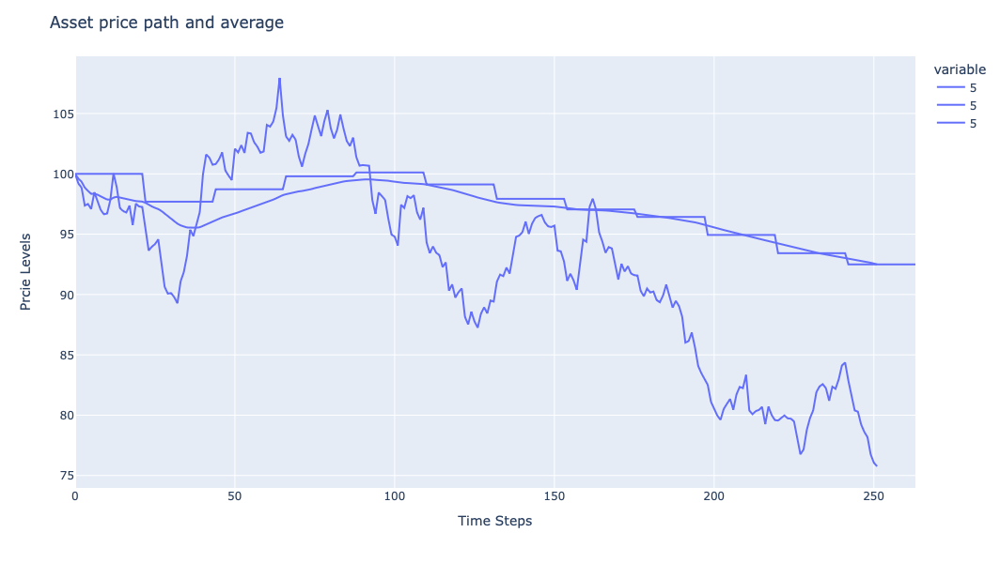

In [262]:
dis = pd.DataFrame(ex1.average('discrete', 'geometric',22)).iloc[:, 5]
dis2 = pd.DataFrame(ex1.average('continuous', 'arithmetic',22)).iloc[:, 5]
asset = price_path1.iloc[:, 5]

#plot
fig1 = px.line(dis)
fig2 = px.line(asset)
fig3 = px.line(dis2)
fig1.add_traces(fig2.data)
fig1.add_traces(fig3.data)
fig1.update_xaxes(title='Time Steps')
fig1.update_yaxes(title='Prcie Levels')
fig1.update_layout(title='Asset price path and average')
fig1.show()

### 2.1.2 Asion Option Pricing

**European Option :** To price an option, we generate many possible price paths that the asset might take at maturity and then calculate option payoffs for each of those generated prices, average them to get the expected payoff and then discount it at risk free to arrive at the final value.

**Combinations for difference method**

In [263]:
# Define variable
style = ['rate', 'strike']
mode = ['continuous', 'discrete']
method = ['arithmetic', 'geometric']
rolling = 5

# Calculate combinations
combinations = list(itertools.product(style, mode, method))

asion_result = []
for combination in combinations:
    result_dict = {'style': str, 'mode': str, 'method': str}
    for key,value in enumerate(result_dict):
        result_dict[value] =  combination[key]

    result_dict['rolling'] = rolling
    asion_result.append(result_dict)
asion_result

[{'style': 'rate', 'mode': 'continuous', 'method': 'arithmetic', 'rolling': 5},
 {'style': 'rate', 'mode': 'continuous', 'method': 'geometric', 'rolling': 5},
 {'style': 'rate', 'mode': 'discrete', 'method': 'arithmetic', 'rolling': 5},
 {'style': 'rate', 'mode': 'discrete', 'method': 'geometric', 'rolling': 5},
 {'style': 'strike',
  'mode': 'continuous',
  'method': 'arithmetic',
  'rolling': 5},
 {'style': 'strike',
  'mode': 'continuous',
  'method': 'geometric',
  'rolling': 5},
 {'style': 'strike', 'mode': 'discrete', 'method': 'arithmetic', 'rolling': 5},
 {'style': 'strike', 'mode': 'discrete', 'method': 'geometric', 'rolling': 5}]

For discte sample, window size is 5(rolling). Calculate the option price for all combinations.

**Asion option pricing function**

In [264]:
# Calculate outcome
def asion_price(path, com):
    ''' path: asset price path; com: combination name '''
    price_outcome = []
    for i in range(len(com)):
        price_outcome.append(path.asian_option(com[i]))
    
    # Combinations name
    name=[]
    for select in com:
        name.append(select['style']+' '+select['mode']+' '+select['method']+' '+str(select['rolling']))

    # Concatenate outcome
    name = np.array(name).reshape((8,1))
    price_outcome = np.array(price_outcome, dtype=float)
    outcome = np.concatenate((name,price_outcome),axis=1)

    return outcome

Markdown table function

In [265]:
# Markdown table function
def markdown_table(data, headers):
    table = "| " + " | ".join(headers) + " | \n "
    
    table += "| " + " | ".join(["---"] * len(headers)) + " | \n "
    
    for row in data:
        table += "| " + " | ".join(str(x) for x in row) + " | \n"

    return table

1. **Lognormal random walk**

In [266]:
ex1 = MC(100, 100, 0.05, 1, 0.2)

In [267]:
data1 = asion_price(ex1, asion_result)
headers = ["Combinations", "Call price", "Put price"]

**Asian Option price table for lognormal random walk**

In [268]:
display(Markdown(markdown_table(data1, headers)))

| Combinations | Call price | Put price | 
 | --- | --- | --- | 
 | rate continuous arithmetic 5 | 5.827577481651353 | 3.2187379248113412 | 
| rate continuous geometric 5 | 5.611425772623954 | 3.335114641564607 | 
| rate discrete arithmetic 5 | 5.7962670475948315 | 3.1975722064421226 | 
| rate discrete geometric 5 | 5.5776025992255125 | 3.315368494395188 | 
| strike continuous arithmetic 5 | 5.86830701624676 | 3.4029871339322533 | 
| strike continuous geometric 5 | 6.07590413035131 | 3.2780558222561393 | 
| strike discrete arithmetic 5 | 5.873860038403 | 3.398395440401191 | 
| strike discrete geometric 5 | 6.084257152032594 | 3.2723318177084 | 


2. **Normal random walk**

In [269]:
ex2 = MC(100, 100, 0.05, 1, 0.2, 'normal')

In [270]:
data2 = asion_price(ex2, asion_result)
headers = ["Combinations", "Call price", "Put price"]

**Asian Option price table for normal random walk**

In [271]:
display(Markdown(markdown_table(data2, headers)))

| Combinations | Call price | Put price | 
 | --- | --- | --- | 
 | rate continuous arithmetic 5 | 5.827908394750011 | 3.2180904561641683 | 
| rate continuous geometric 5 | 5.611952553285162 | 3.3345931400470428 | 
| rate discrete arithmetic 5 | 5.796657546903814 | 3.1969965755304113 | 
| rate discrete geometric 5 | 5.578103865818266 | 3.3148331452144704 | 
| strike continuous arithmetic 5 | 5.868552534271332 | 3.401881212257619 | 
| strike continuous geometric 5 | 6.0760472753394525 | 3.2769174279780158 | 
| strike discrete arithmetic 5 | 5.874114578402092 | 3.39728628917594 | 
| strike discrete geometric 5 | 6.084395691593747 | 3.271177151597986 | 


3. **Lognormal random walk and stochastic volatiltity**

In [272]:
ex3 = MC(100, 100, 0.05, 1, 0.2, 'stochastic volatility', 0.4, 0.7)

In [273]:
data3 = asion_price(ex3, asion_result)
headers = ["Combinations", "Call price", "Put price"]

**Asian Option price table for Lognormal random walk and stochastic volatiltity**

In [274]:
display(Markdown(markdown_table(data3, headers)))

| Combinations | Call price | Put price | 
 | --- | --- | --- | 
 | rate continuous arithmetic 5 | 6.367543853004719 | 3.9603581114224258 | 
| rate continuous geometric 5 | 5.987747708284161 | 4.220716751525736 | 
| rate discrete arithmetic 5 | 6.336214200832616 | 3.938556544401963 | 
| rate discrete geometric 5 | 5.952864155389206 | 4.201559030839097 | 
| strike continuous arithmetic 5 | 7.528200386319953 | 5.136014666225377 | 
| strike continuous geometric 5 | 7.876584000634193 | 4.844243495715749 | 
| strike discrete arithmetic 5 | 7.529851721825696 | 5.128137916579482 | 
| strike discrete geometric 5 | 7.882160379489785 | 4.834094042363024 | 


### 2.1.3 Asion Option Discussion

Continuously sampled geometric average rate, lognormal random walk.

In [275]:
dic_asion={'style':'rate', 'mode': 'continuous', 'method': 'geometric','rolling': 5}

**S0**

In [276]:
S0 = np.linspace(0, 180, 100)
E = 100
r = 0.05
T = 1
sigma = 0.2

option_S0 = []
for s in S0:
    option_S0.append(MC(s, E, r, T, sigma).asian_option(dic_asion))
option_S0[-1]

[80.19571399596396, 0.0]

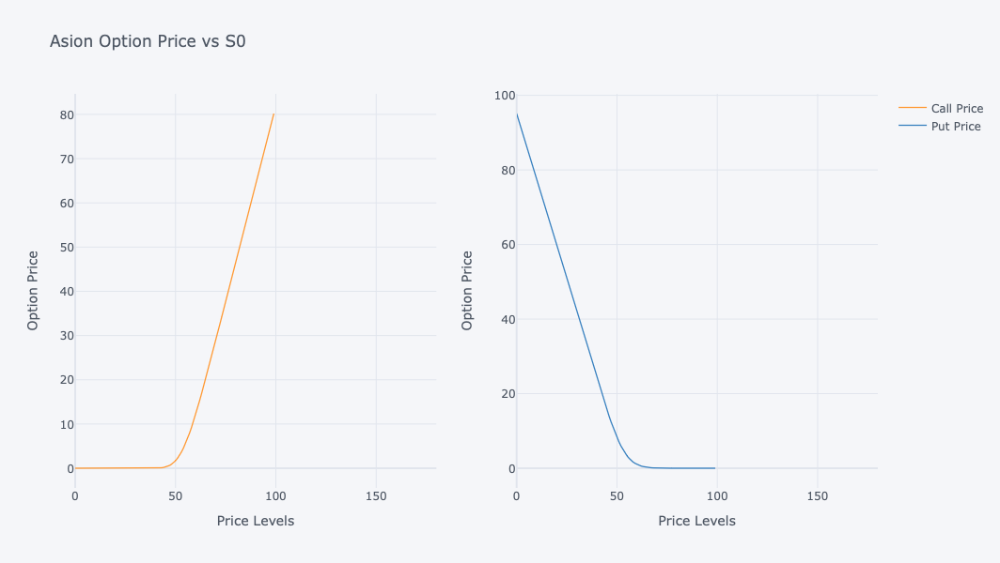

In [277]:
asion_S0_plot = pd.DataFrame(option_S0, columns=['Call Price', 'Put Price'])
asion_S0_plot.iplot(kind='line', xrange=[0,180], subplots=True, title='Asion Option Price vs S0 ', xTitle='Price Levels', yTitle='Option Price')

**E**

In [278]:
S0 = 100
E = np.linspace(20, 180, 100)
r = 0.05
T = 1
sigma = 0.2

option_E = []
for e in E:
    option_E.append(MC(S0, e, r, T, sigma).asian_option(dic_asion))
option_E[-1]

[0.0, 73.82204282899777]

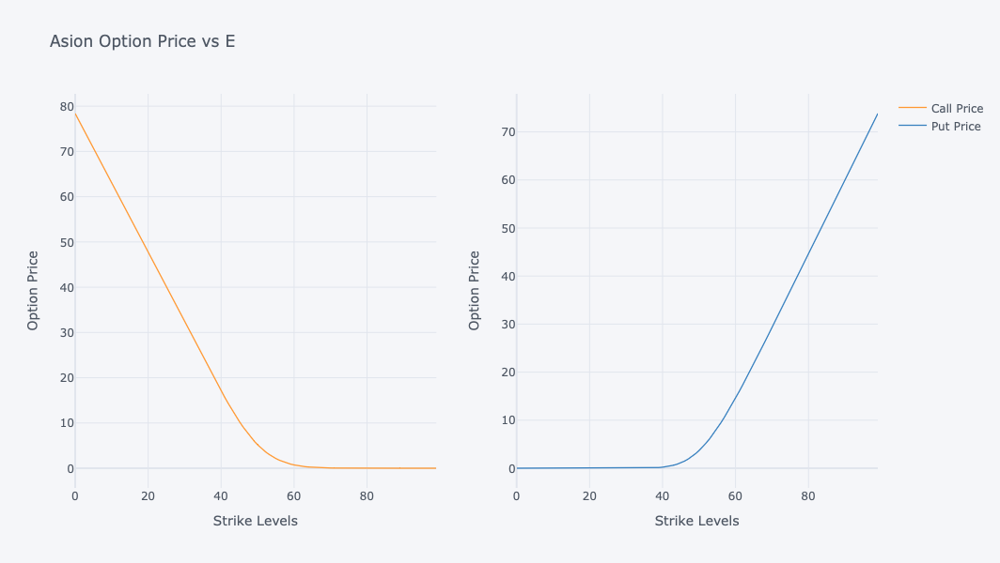

In [279]:
asion_E_plot = pd.DataFrame(option_E, columns=['Call Price', 'Put Price'])
asion_E_plot.iplot(kind='line', subplots=True, title='Asion Option Price vs E ', xTitle='Strike Levels', yTitle='Option Price')

**R**

In [280]:
S0 = 100
E = 100
r = np.linspace(0.1,0.8 , 100)
T = 1
sigma = 0.2

option_r = []
for rs in r:
    option_r.append(MC(S0, E, rs, T, sigma).asian_option(dic_asion))
option_r[-1]

[21.909368705238368, 0.0003435585989579629]

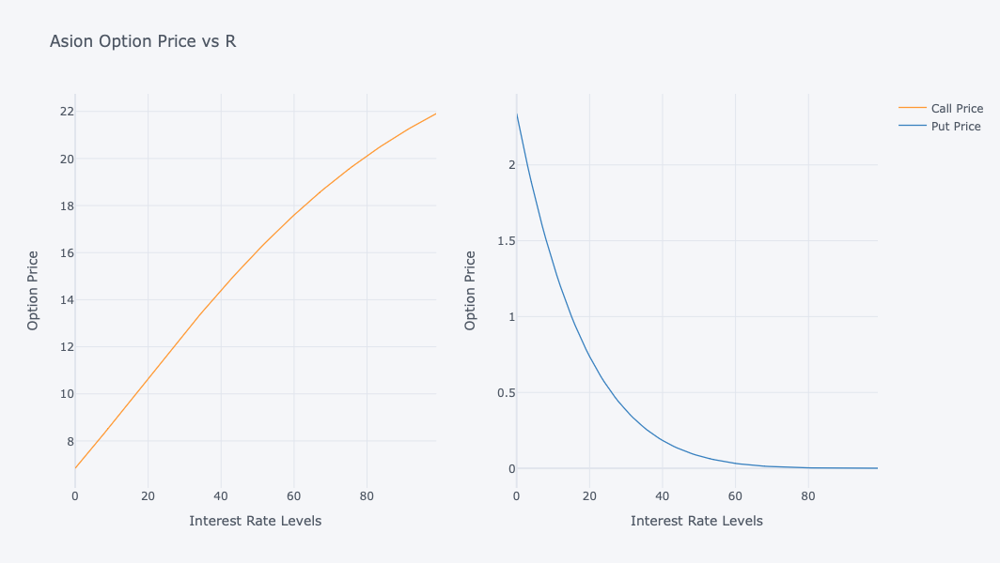

In [281]:
asion_r_plot = pd.DataFrame(option_r, columns=['Call Price', 'Put Price'])
asion_r_plot.iplot(kind='line', subplots=True, title='Asion Option Price vs R ', xTitle='Interest Rate Levels', yTitle='Option Price')

**T**

In [282]:
S0 = 100
E = 100
r = 0.05
T = np.linspace(1, 10, 100)
sigma = 0.2

option_T = []
for t in T:
    option_T.append(MC(S0, E, r, t, sigma).asian_option(dic_asion))
option_T[-1]

[19.04328282778808, 3.979602068974693]

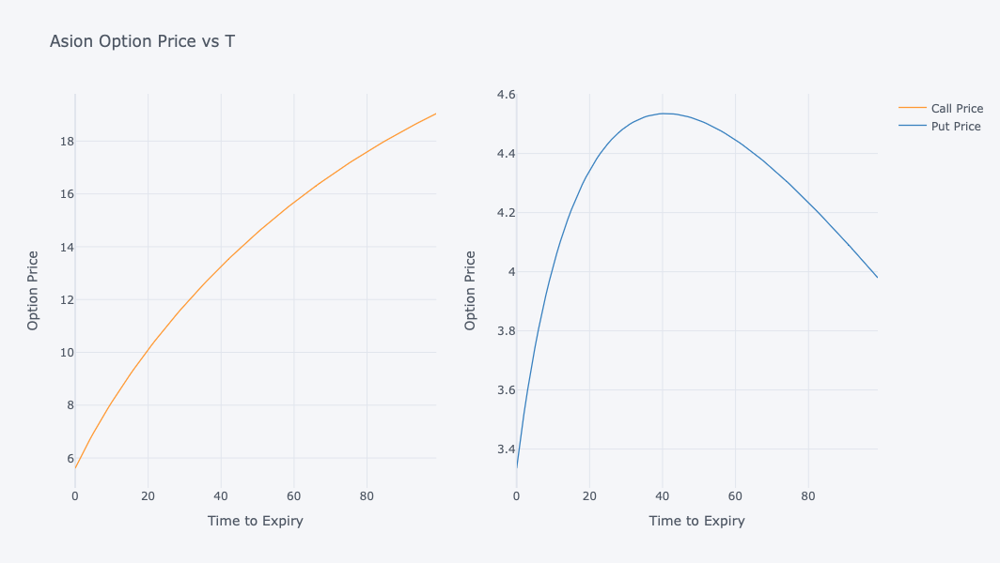

In [283]:
asion_T_plot = pd.DataFrame(option_T, columns=['Call Price', 'Put Price'])
asion_T_plot.iplot(kind='line', subplots=True, title='Asion Option Price vs T ', xTitle='Time to Expiry', yTitle='Option Price')

**Sigma**

In [284]:
S0 = 100
E = 100
r = 0.05
T = 1
sigma = np.linspace(0, 1, 100)

option_sigma = []
for si in sigma:
    option_sigma.append(MC(S0, E, r, T, si).asian_option(dic_asion))
option_sigma[-1]

[18.71753328295312, 23.278383146520262]

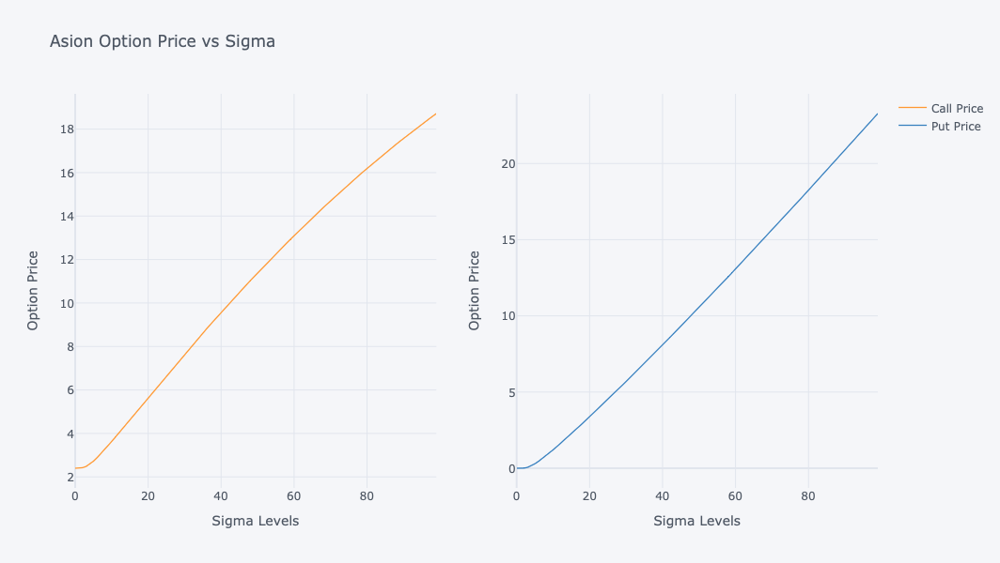

In [285]:
asion_sigma_plot = pd.DataFrame(option_sigma, columns=['Call Price', 'Put Price'])
asion_sigma_plot.iplot(kind='line', subplots=True, title='Asion Option Price vs Sigma ', xTitle='Sigma Levels', yTitle='Option Price')

**R is the random number for uniform distribution**

In [286]:
np.random.seed(1000)

S0 = 100
E = 100
r = np.random.random(1000)
T = 1
sigma = 0.2

option_uniform = []
for rs in r:
      option_uniform.append(MC(S0, E, rs, T, sigma).asian_option(dic_asion))
    
option_uniform[0]

[19.9258209936015, 0.003793745880571518]

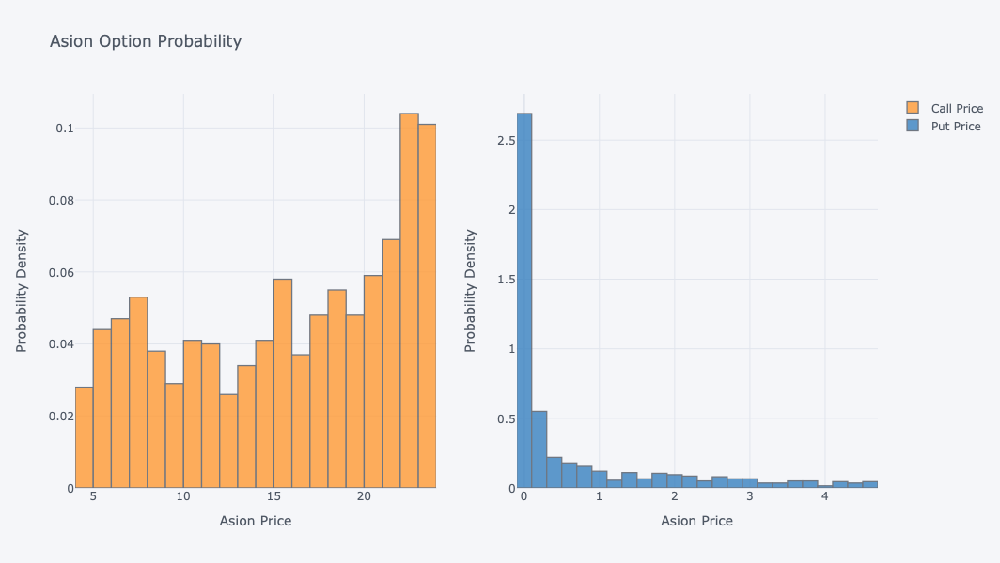

In [287]:
asion_uniform_plot = pd.DataFrame(option_uniform, columns=['Call Price', 'Put Price'])
asion_uniform_plot.iplot(kind='histogram', subplots=True, histnorm='probability density',
                       title='Asion Option Probability', xTitle='Asion Price', yTitle='Probability Density')

R represents a random number from a uniform distribution. The call price of a Lookback option exhibits a linear relationship with the interest rate, but it is a weak relation. From the figure above, we can determine whether the option is 'in the money' or 'out of the money.' But put price is unknown.

**Time Value**

In [288]:
S0 = 100
E = 100
r = 0.05
T = 1
sigma = 0.2
time_step = 252

option_time = []
for i in range(time_step):
        option_time.append(MC(S0, E, r, T-i/252, sigma).asian_option(dic_asion, i/252))

option_time[0]

[5.611425772623954, 3.335114641564607]

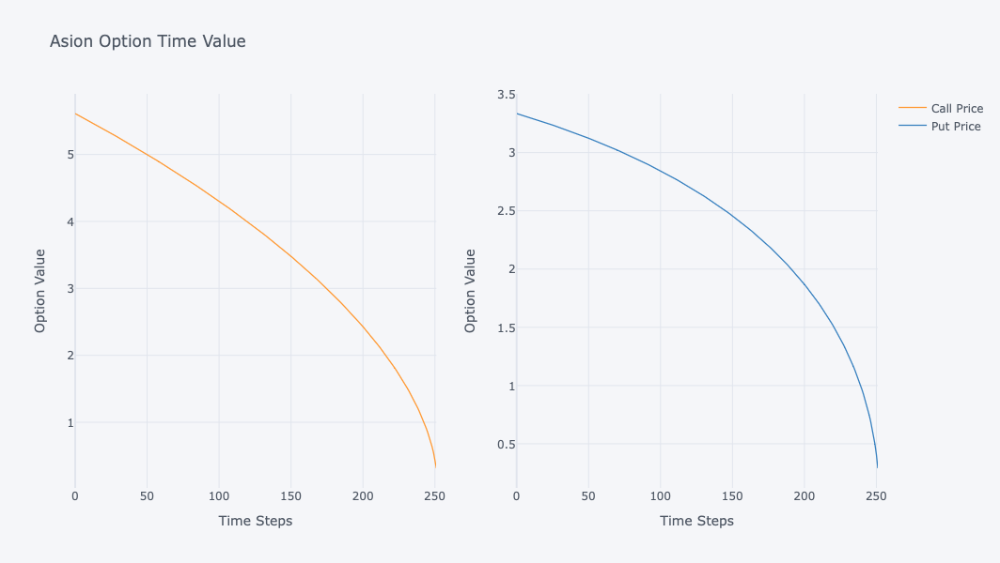

In [289]:
option_time_plot = pd.DataFrame(option_time, columns=['Call Price', 'Put Price'])
option_time_plot.iplot(kind='line', subplots=True, 
                       title='Asion Option Time Value', xTitle='Time Steps', yTitle='Option Value')

### 2.1.4 Greeks

The simplest way to calculate the Greeks of an option using Monte Carlo simulation is to estimate the option's value twice.

**Lognoraml random walk and stochastic volatility**

Using **control variates**, take a specific range for a single variable, and see the effect on the Greeks.

**The geometric average rate for continuously sampled**

In [290]:
dic_asion={'style':'rate', 'mode': 'continuous', 'method': 'geometric','rolling': 5}

**Delta**

$$\Delta = \lim_{h \to 0} \frac{V(S+h,t)-V(S-h,t)}{2h} $$

This is the central difference, an accurate estimate of the first derivative, with error of $O(h^2)$.

In [291]:
# Parameter 
S0, E, r, T, sigma, process, mu, std, D, ts, num=np.linspace(50,150, 100), 100, 0.05, 1, 0.2, 'stochastic volatility', 0.4, 0.7, 0.0, 252, 10000

delta =[]
for s in S0:
    delta.append( Greeks(s, E, r, T, sigma, 'asian', dic_asion, process, mu, std, D, ts, num).delta())
    
delta = pd.DataFrame(delta, columns=['Call Option', 'Put Option'])
delta.head()

,Call Option,Put Option
0,0.000000,-0.96890
1,0.000000,-0.96890
2,0.000000,-0.96890
3,0.000179,-0.96872
4,0.000179,-0.96872


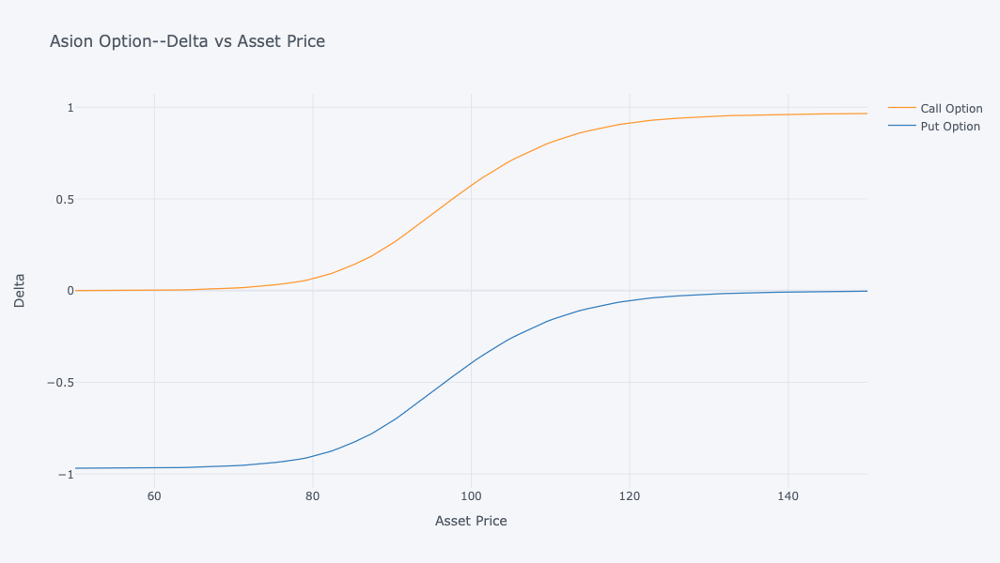

In [292]:
delta=delta.set_index(S0)
delta.iplot(x=[delta.index], title='Asion Option--Delta vs Asset Price', xTitle='Asset Price', yTitle='Delta')

**Gamma**

The forward difference is

$$\frac{V(S+h,t)-V(S,t)}{h}$$

The backward difference is 

$$\frac{V(S,t)-V(S-h,t)}{h}$$

Take the difference between these two deltas, divide by h, the distance between the two mid-points, to get the natural approxiamtion to gamma being

$$\Gamma \approx \frac{V(S+h,t)-2V(S,t)+V(S-h,t)}{h^2}$$

In [293]:
# Parameter setting
S0, E, r, T, sigma, process, mu, std, D, ts, num=np.linspace(50,150, 100), 100, 0.05, 1, 0.2, 'stochastic volatility', 0.4, 0.7, 0.0, 252, 10000

gamma =[]
for s in S0:
    gamma.append( Greeks(s,E, r, T, sigma, 'asian', dic_asion, process, mu, std, D, ts, num).gamma(0.7))

gamma = pd.DataFrame(gamma, columns=['Call Option', 'Put Option'])
gamma.head()

,Call Option,Put Option
0,0.000000,-2.900174e-14
1,0.000000,1.450087e-14
2,0.000000,1.450087e-14
3,0.000244,2.440919e-04
4,0.000099,9.880344e-05


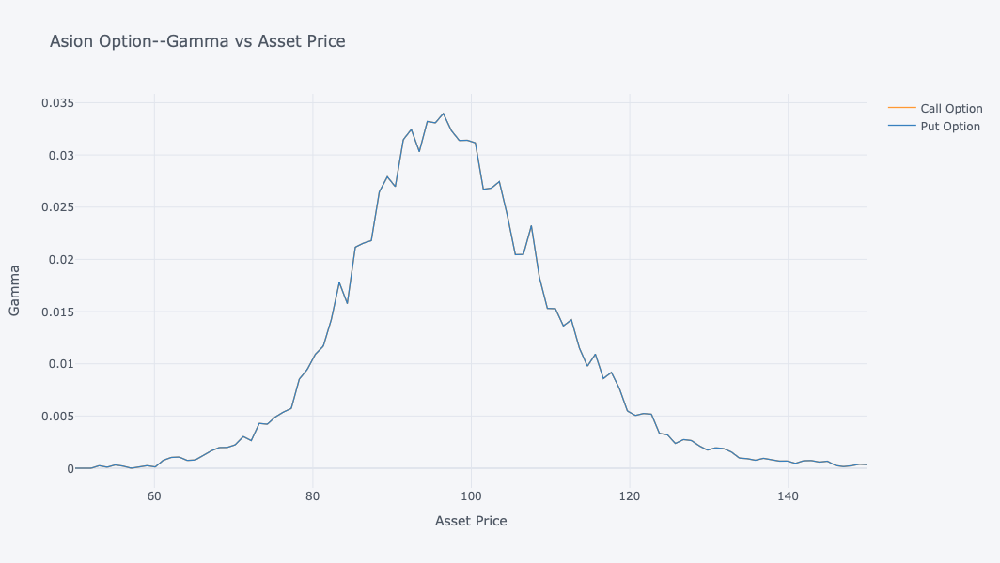

In [294]:
gamma=gamma.set_index(S0)
gamma.iplot(x=[gamma.index], title='Asion Option--Gamma vs Asset Price', xTitle='Asset Price', yTitle='Gamma')

**Vega**

$$Vega = \frac{V(\sigma +d\sigma,S,t)-V(\sigma -d\sigma,S,t)}{d\sigma}$$

In [295]:
# Parameter setting
S0, E, r, T, sigma, process, mu, std, D, ts, num=100, 100, 0.05, 1, np.linspace(0.0,0.9, 100) , 'stochastic volatility', 0.4, 0.7, 0.0, 252, 10000

vega =[]
for si in sigma:
    vega.append( Greeks(S0, E, r, T,si, 'asian', dic_asion, process, mu, std, D, ts, num).vega())

vega = pd.DataFrame(vega, columns=['Call Option', 'Put Option'])
vega.head()

,Call Option,Put Option
0,0.126068,-0.001651
1,0.930669,1.104485
2,4.216362,4.691610
3,9.298070,10.074575
4,13.741115,14.818629


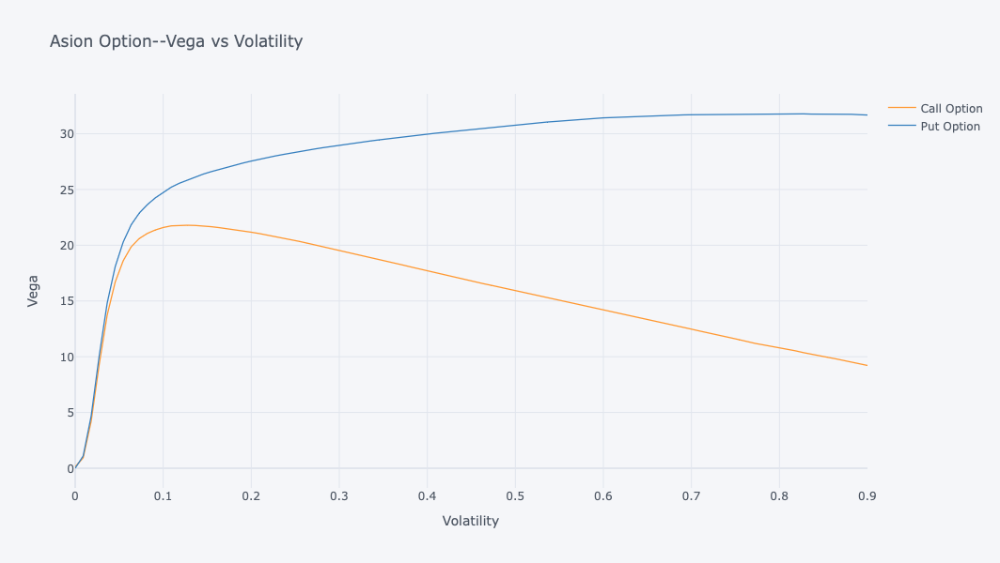

In [296]:
vega=vega.set_index(sigma)
vega.iplot(x=[vega.index], title='Asion Option--Vega vs Volatility', xTitle='Volatility', yTitle='Vega')

**Rho**

$$\rho = \frac{V(S,t)_{r+dr}-V(S,t)_{r-dr}}{dr}$$

In [297]:
# Parameter setting
S0, E, r, T, sigma, process, mu, std, D, ts, num=100, 100, np.linspace(0.01, 0.08, 100), 1, 0.2 , 'stochastic volatility', 0.4, 0.7, 0.0, 252, 10000

rho =[]
for rate in r:
    rho.append( Greeks(S0, E, rate, T,sigma, 'asian', dic_asion, process, mu, std, D, ts, num).rho())
rho = pd.DataFrame(rho, columns=['Call Option', 'Put Option'])
rho.head()

,Call Option,Put Option
0,20.907399,-28.475322
1,20.938837,-28.391514
2,20.970494,-28.307530
3,21.002574,-28.223168
4,21.033923,-28.139579


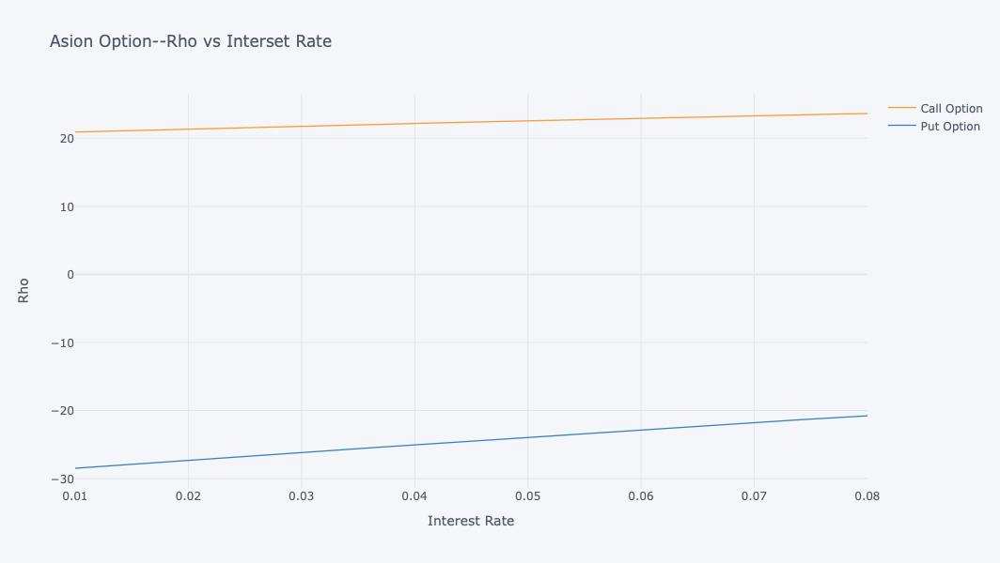

In [298]:
rho=rho.set_index(r)
rho.iplot(x=[rho.index], title='Asion Option--Rho vs Interset Rate', xTitle='Interest Rate', yTitle='Rho')

**Theta**

$$\Theta = \frac{V(S,t+dt)-V(S,t-dt)}{dt}$$

In [299]:
# Parameter setting
S0, E, r, T, sigma, process, mu, std, D, ts, num=100, 100, 0.05, 1, 0.2 , 'stochastic volatility', 0.4, 0.7, 0.0, 252, 10000

time = np.linspace(0, T, ts)
asian_theta =[]
for t in time:
    asian_theta.append( Greeks(S0, E, r, T,sigma, 'asian', dic_asion, process, mu, std, D, ts, num).asian_theta(t))

asian_theta = pd.DataFrame(asian_theta, columns=['Call Option', 'Put Option'])
asian_theta.head()

,Call Option,Put Option
0,-3.414734,-2.267454
1,-3.413866,-2.268087
2,-3.420372,-2.268748
3,-3.427739,-2.270281
4,-3.435175,-2.271896


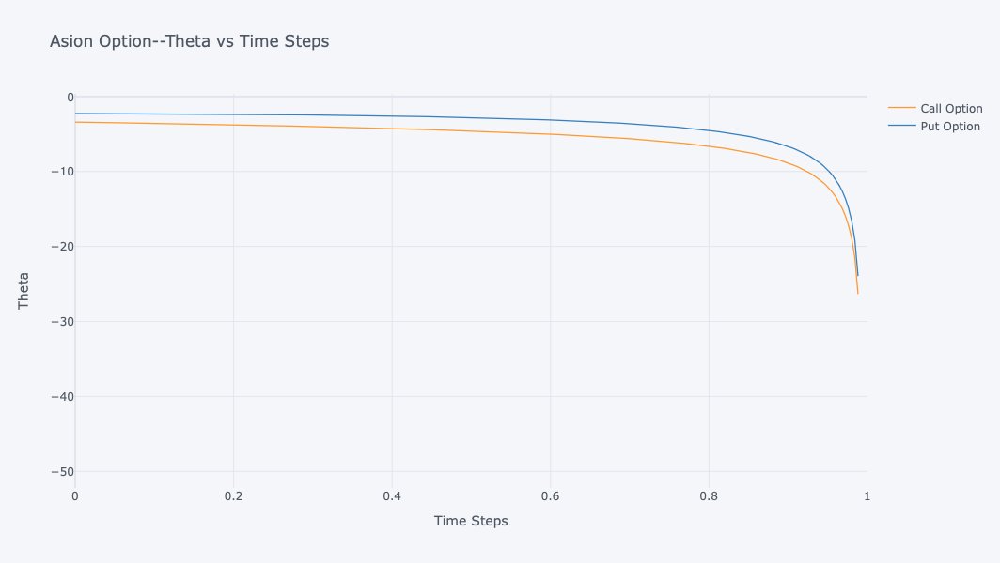

In [300]:
asian_theta=asian_theta.set_index(time)
asian_theta.iplot(x=[asian_theta.index], title='Asion Option--Theta vs Time Steps', xTitle='Time Steps', yTitle='Theta')

### 2.2.1 Lookback Option

A lookback option pays off some function of the realized maximum and/or minimum of underlying asset over prescribed period.

**Types of Payoff**

For the basic lookback option, the payoffs comes in two varieties.These are the **rate** and the **strike**, also called the **fixed strike** and the **floating strike** respectively.

1. **Continuously sampled measure**

**Floating striking call** has a payoff

$$max(S-M,0) = S-M$$

where M is the realized minimum of the asset price.

**Floating strike put** has a payoff

$$max(M-S,0) = M-S$$

where M is the realized maximum of asset price.

**Fixed strike call** has a payoff given by 

$$max(M-E,0)$$

where M is the realized maximum, E is the strike price.

**Fixed strike put** has a payoff given by

$$max(E-M,0)$$

where M is the realized minimum.

2. **Discrete measurement**

When the **maximum/minimum** is measured at discrete times we must first define the updating rule, if the **maximum/minimum** is measured at times $t_i$ then the updating rule is simply

$$M_i = max/min(S(t_i), M(i-1))$$

**Figure for the asset price path and maximum/minimum**

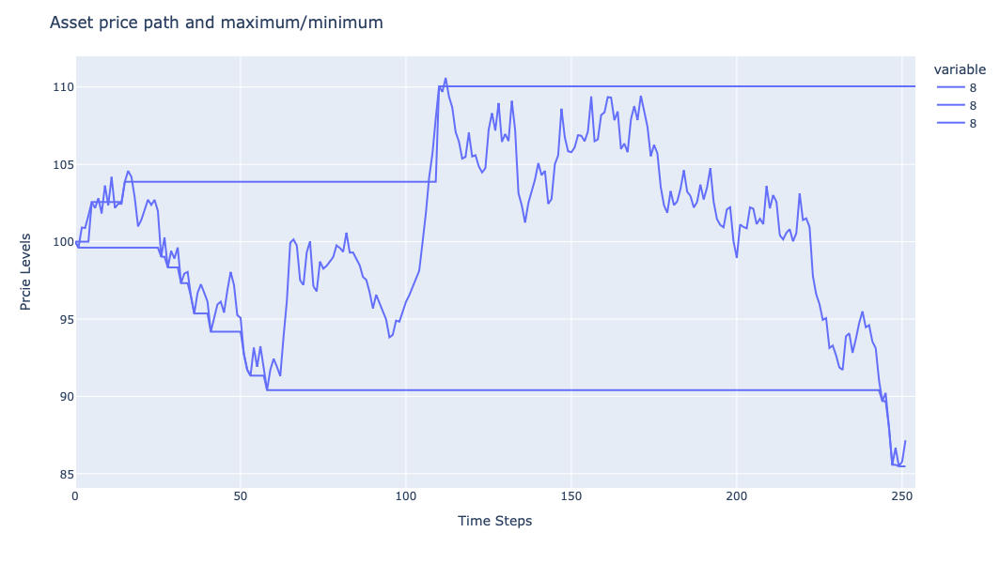

In [301]:
path = ex1.mc_sim_path
dis = pd.DataFrame(ex1.discrete_max_min(path, 'maximum')).iloc[:, 8]
dis2 = pd.DataFrame(ex1.continuous_min(path)).iloc[:, 8]
asset = price_path1.iloc[:, 8]

#plot
fig1 = px.line(dis)
fig2 = px.line(asset)
fig3 = px.line(dis2)
fig1.add_traces(fig2.data)
fig1.add_traces(fig3.data)
fig1.update_xaxes(title='Time Steps')
fig1.update_yaxes(title='Prcie Levels')
fig1.update_layout(title='Asset price path and maximum/minimum')
fig1.show()

### 2.2.2 Lookback Option Pricing

**Combinations for difference method**

In [302]:
# Define variable
style = ['fixed', 'floating']
mode = ['continuous', 'discrete']
rolling = 5

# Calculate combinations
combinations = list(itertools.product(style, mode))

lookback_result = []
for combination in combinations:
    result_dict = {'style': str, 'mode': str}
    for key,value in enumerate(result_dict):
        result_dict[value] =  combination[key]

    result_dict['rolling'] = rolling
    lookback_result.append(result_dict)
lookback_result

[{'style': 'fixed', 'mode': 'continuous', 'rolling': 5},
 {'style': 'fixed', 'mode': 'discrete', 'rolling': 5},
 {'style': 'floating', 'mode': 'continuous', 'rolling': 5},
 {'style': 'floating', 'mode': 'discrete', 'rolling': 5}]

**Lookback option pricing function**

In [303]:
# Calculate outcome
def lookback_price(path, com):
    ''' path: asset price path; com: combination name '''
    price_outcome = []
    for i in range(len(com)):
        price_outcome.append(path.lookback_option(com[i]))
    
    # Combinations name
    name=[]
    for select in com:
        name.append(select['style']+' '+select['mode']+' '+str(select['rolling']))

    # Concatenate outcome
    name = np.array(name).reshape((4,1))
    price_outcome = np.array(price_outcome,dtype=float)
    outcome = np.concatenate((name,price_outcome),axis=1)

    return outcome

1. **Lognormal random walk**

In [304]:
ex1 = MC(100, 100, 0.05, 1, 0.2)

In [305]:
data4 = lookback_price(ex1, lookback_result)
headers = ["Combinations", "Call price", "Put price"]

**Lookback Option price table for lognormal random walk**

In [306]:
display(Markdown(markdown_table(data4, headers)))

| Combinations | Call price | Put price | 
 | --- | --- | --- | 
 | fixed continuous 5 | 18.47166554338252 | 11.514174900409284 | 
| fixed discrete 5 | 17.465534476332827 | 10.80545057103018 | 
| floating continuous 5 | 16.588334339563808 | 13.397506104228004 | 
| floating discrete 5 | 15.91559448546199 | 12.467905092796054 | 


2. **Normal random walk**

In [307]:
ex2 = MC(100, 100, 0.05, 1, 0.2, 'normal')

In [308]:
data5 = lookback_price(ex2, lookback_result)
headers = ["Combinations", "Call price", "Put price"]

**Lookback Option price table for normal random walk**

In [309]:
display(Markdown(markdown_table(data5, headers)))

| Combinations | Call price | Put price | 
 | --- | --- | --- | 
 | fixed continuous 5 | 18.472773502906605 | 11.512868114738572 | 
| fixed discrete 5 | 17.466155929342285 | 10.80439110506139 | 
| floating continuous 5 | 16.58935737533813 | 13.39628424230705 | 
| floating discrete 5 | 15.916752809176058 | 12.46616674915463 | 


3. **Lognormal random walk and stochastic volatiltity**

In [310]:
ex3 = MC(100, 100, 0.05, 1, 0.2, 'stochastic volatility', 0.4, 0.7)

In [311]:
data6 = lookback_price(ex3, lookback_result)
headers = ["Combinations", "Call price", "Put price"]

**Lookback Option price table for Lognormal random walk and stochastic volatiltity**

In [312]:
display(Markdown(markdown_table(data6, headers)))

| Combinations | Call price | Put price | 
 | --- | --- | --- | 
 | fixed continuous 5 | 23.46898031920093 | 14.97695403440771 | 
| fixed discrete 5 | 21.928682794020805 | 14.050180483145372 | 
| floating continuous 5 | 19.776325496084578 | 18.669608857524068 | 
| floating discrete 5 | 18.91743746766682 | 17.268538174083712 | 


### 2.2.3 Lookback Option Discussion

Continuously sampled fixed strike lookback, lognormal random walk.

In [313]:
dic_lookback={'style':'fixed', 'mode': 'continuous','rolling': 5}

**S0**

In [314]:
S0 = np.linspace(0, 180, 100)
E = 100
r = 0.05
T = 1
sigma = 0.2

lookback_option_S0 = []
for s in S0:
    lookback_option_S0.append(MC(s, E, r, T, sigma).lookback_option(dic_lookback))
lookback_option_S0[-1]

[109.34735193814566, 0.007265657248722292]

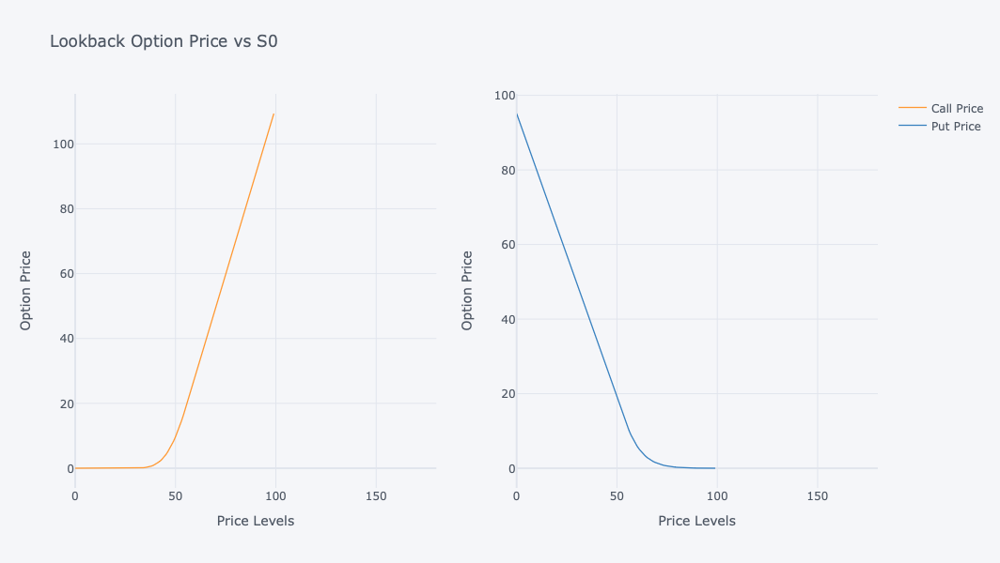

In [315]:
lookback_S0_plot = pd.DataFrame(lookback_option_S0, columns=['Call Price', 'Put Price'])
lookback_S0_plot.iplot(kind='line', xrange=[0,180], subplots=True, title='Lookback Option Price vs S0 ', xTitle='Price Levels', yTitle='Option Price')

**E**

In [316]:
S0 = 100
E = np.linspace(20, 180, 100)
r = 0.05
T = 1
sigma = 0.2

lookback_option_E = []
for e in E:
    lookback_option_E.append(MC(S0, e, r, T, sigma).lookback_option(dic_lookback))
lookback_option_E[-1]

[0.05037668620788664, 87.61252886046641]

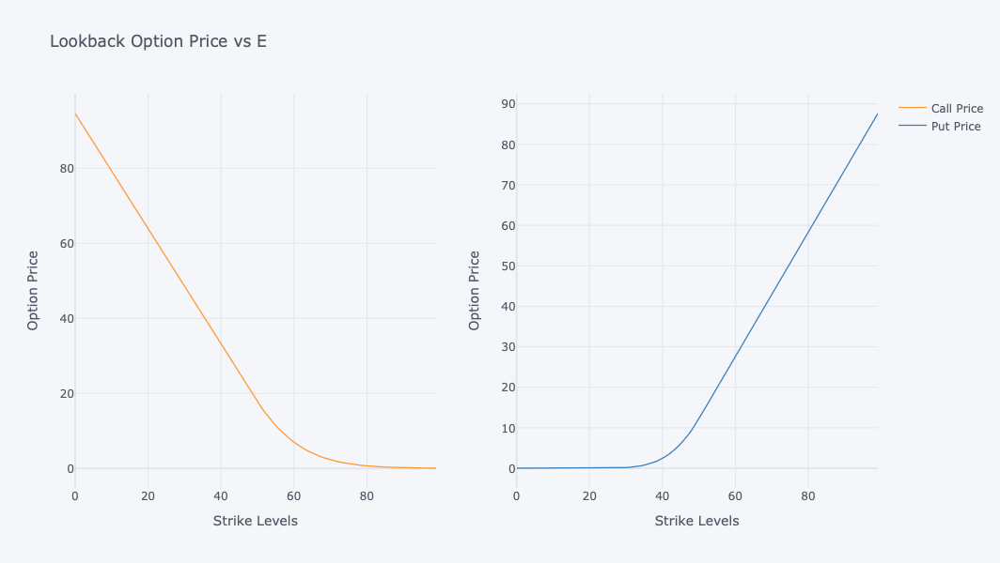

In [317]:
lookback_E_plot = pd.DataFrame(lookback_option_E, columns=['Call Price', 'Put Price'])
lookback_E_plot.iplot(kind='line', subplots=True, title='Lookback Option Price vs E ', xTitle='Strike Levels', yTitle='Option Price')

**R**

In [318]:
S0 = 100
E = 100
r = np.linspace(0.1,0.8 , 100)
T = 1
sigma = 0.2

lookback_option_r = []
for rs in r:
    lookback_option_r.append(MC(S0, E, rs, T, sigma).lookback_option(dic_lookback))
lookback_option_r[-1]

[56.79476406607546, 0.815295625392658]

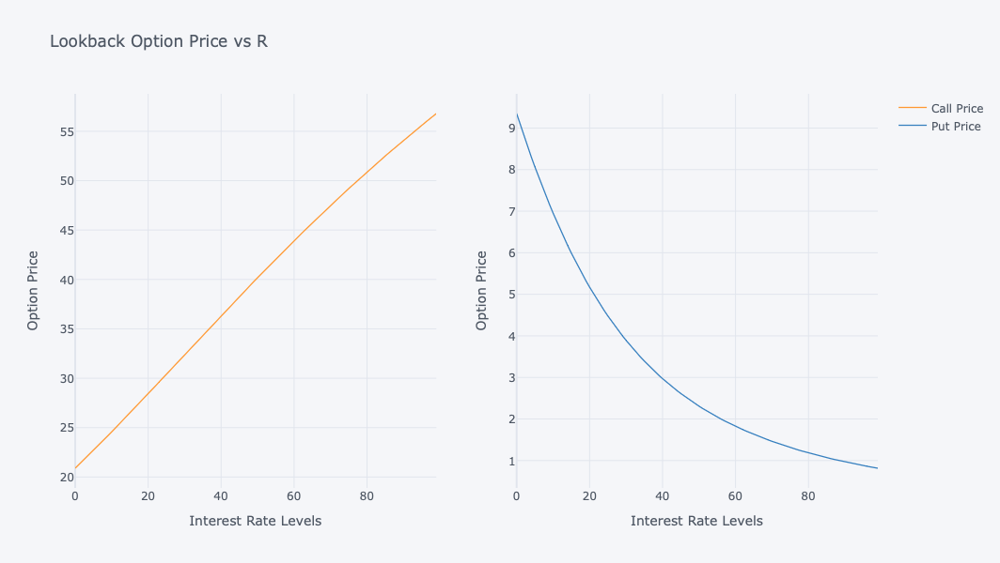

In [319]:
lookback_r_plot = pd.DataFrame(lookback_option_r, columns=['Call Price', 'Put Price'])
lookback_r_plot.iplot(kind='line', subplots=True, title='Lookback Option Price vs R ', xTitle='Interest Rate Levels', yTitle='Option Price')

**T**

In [320]:
S0 = 100
E = 100
r = 0.05
T = np.linspace(1, 10, 100)
sigma = 0.2

lookback_option_T = []
for t in T:
    lookback_option_T.append(MC(S0, E, r, t, sigma).lookback_option(dic_lookback))
lookback_option_T[-1]

[69.58724123925265, 15.7311598924273]

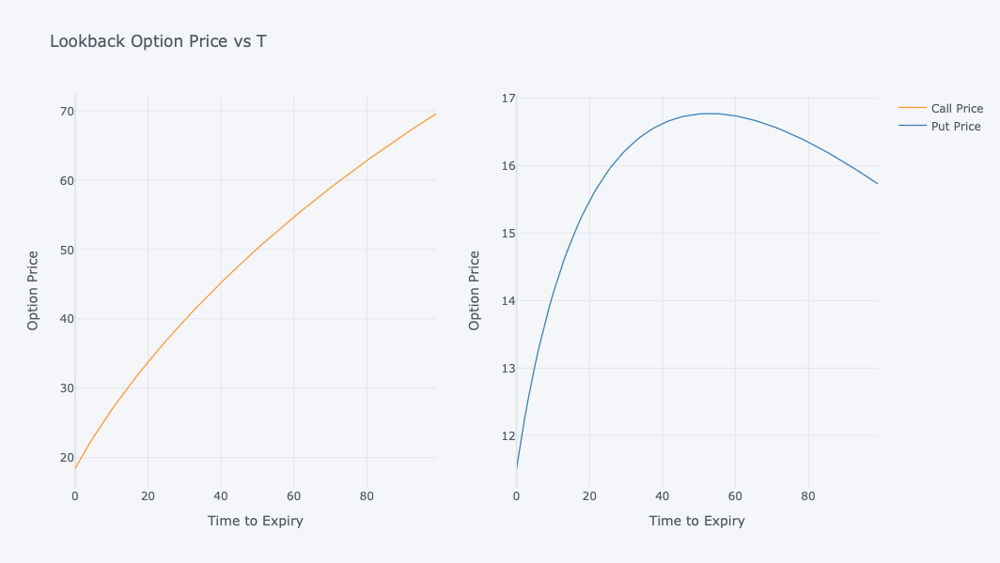

In [321]:
lookback_T_plot = pd.DataFrame(lookback_option_T, columns=['Call Price', 'Put Price'])
lookback_T_plot.iplot(kind='line', subplots=True, title='Lookback Option Price vs T ', xTitle='Time to Expiry', yTitle='Option Price')

**Sigma**

In [322]:
S0 = 100
E = 100
r = 0.05
T = 1
sigma = np.linspace(0, 1, 100)

lookback_option_sigma = []
for si in sigma:
    lookback_option_sigma.append(MC(S0, E, r, T, si).lookback_option(dic_lookback))
lookback_option_sigma[-1]

[101.77875395913881, 52.1548742332834]

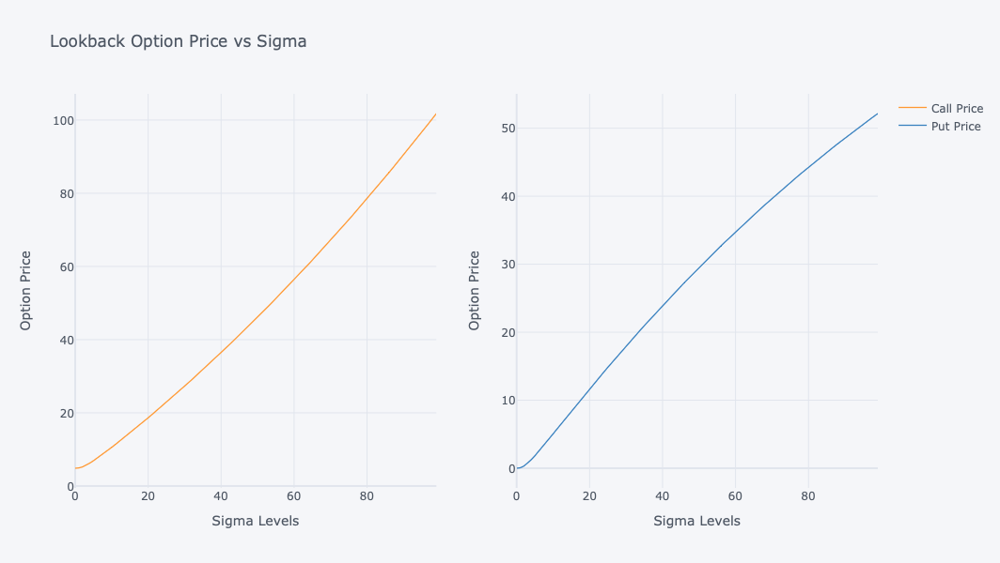

In [323]:
lookback_sigma_plot = pd.DataFrame(lookback_option_sigma, columns=['Call Price', 'Put Price'])
lookback_sigma_plot.iplot(kind='line', subplots=True, title='Lookback Option Price vs Sigma ', xTitle='Sigma Levels', yTitle='Option Price')

**R is the random number for uniform distribution**

In [324]:
np.random.seed(1000)

S0 = 100
E = 100
r = np.random.random(1000)
T = 1
sigma = 0.2

lookback_option_uniform = []
for rs in r:
      lookback_option_uniform.append(MC(S0, E, rs, T, sigma).lookback_option(dic_lookback))
    
lookback_option_uniform[0]

[50.310794264667905, 1.226532026372453]

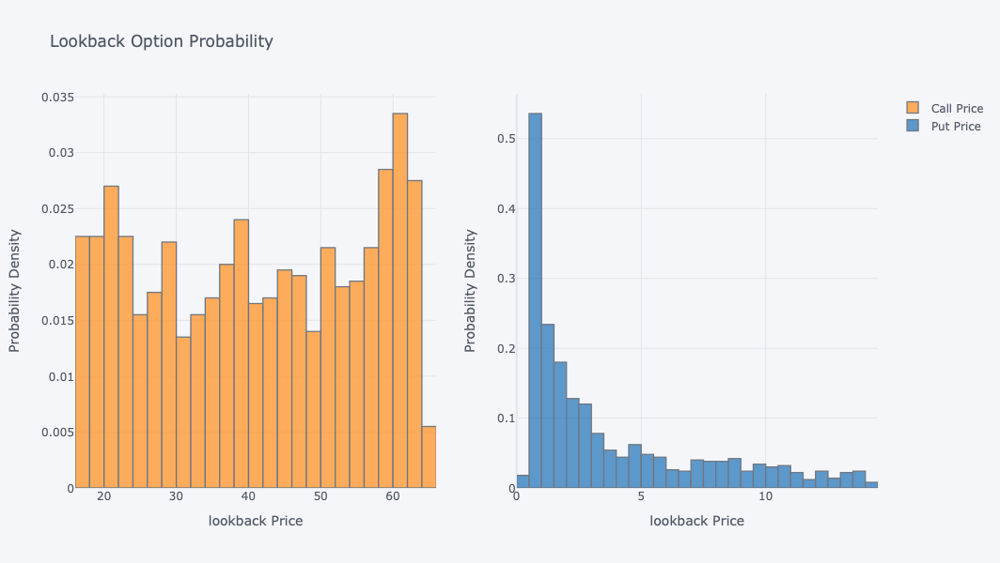

In [325]:
lookback_uniform_plot = pd.DataFrame(lookback_option_uniform, columns=['Call Price', 'Put Price'])
lookback_uniform_plot.iplot(kind='histogram', subplots=True, histnorm='probability density',
                       title='Lookback Option Probability', xTitle='lookback Price', yTitle='Probability Density')

R represents a random number from a uniform distribution. The call price of a Lookback option exhibits a linear relationship with the interest rate. From the figure above, we can determine whether the option is 'in the money' or 'out of the money.' But put call price unknown.

**Time Value**

In [326]:
S0 = 100
E = 100
r = 0.05
T = 1
sigma = 0.2
time_step = 252

lookback_option_time = []
for i in range(time_step):
        lookback_option_time.append(MC(S0, E, r, T-i/252, sigma).lookback_option(dic_lookback, i/252))

lookback_option_time[0]

[18.47166554338252, 11.514174900409284]

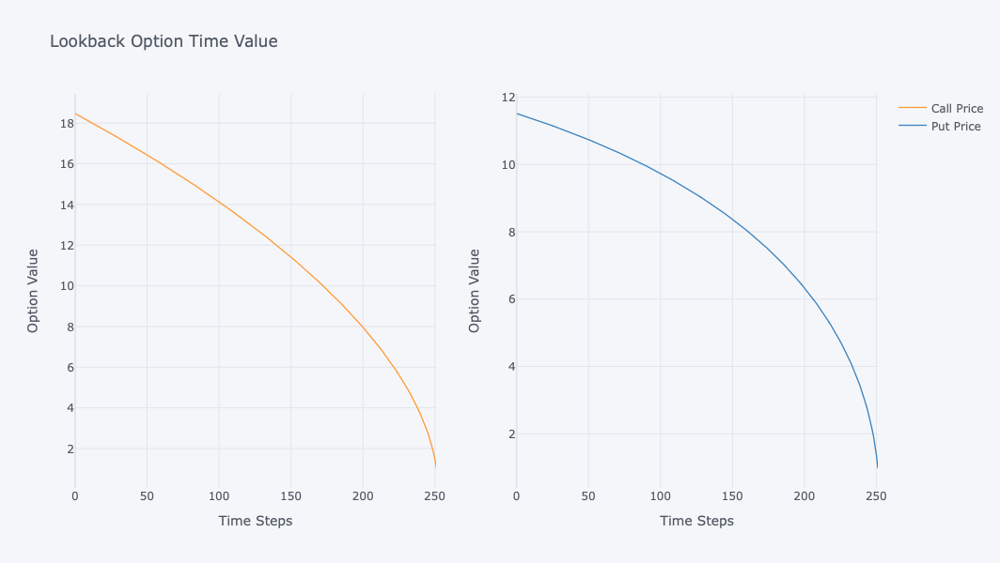

In [327]:
lookback_time_plot = pd.DataFrame(lookback_option_time, columns=['Call Price', 'Put Price'])
lookback_time_plot.iplot(kind='line', subplots=True, 
                       title='Lookback Option Time Value', xTitle='Time Steps', yTitle='Option Value')

As expiration approaches, the time value of an option exhibits non-linear decay. The closer it gets to expiration, the faster the option's value declines, aligning with the behavior of theta.

### 2.2.4 Greeks

**Lognoraml random walk and stochastic volatility**

Using **control variates**, take a specific range for a single variable, and see the effect on the Greeks.

**The fixed strike lookback for continuously sampled**

In [328]:
dic_lookback={'style':'fixed', 'mode': 'continuous','rolling': 5}

**Delta**

In [329]:
# Parameter 
S0, E, r, T, sigma, process, mu, std, D, ts, num=np.linspace(50,150, 100), 100, 0.05, 1, 0.2, 'stochastic volatility', 0.4, 0.7, 0.0, 252, 10000

delta =[]
for s in S0:
    delta.append( Greeks(s, E, r, T, sigma, 'lookback', dic_lookback, process, mu, std, D, ts, num).delta())
    
delta = pd.DataFrame(delta, columns=['Call Option', 'Put Option'])
delta.head()

,Call Option,Put Option
0,0.052597,-0.80146
1,0.058053,-0.80146
2,0.062857,-0.80146
3,0.069008,-0.80146
4,0.075051,-0.80146


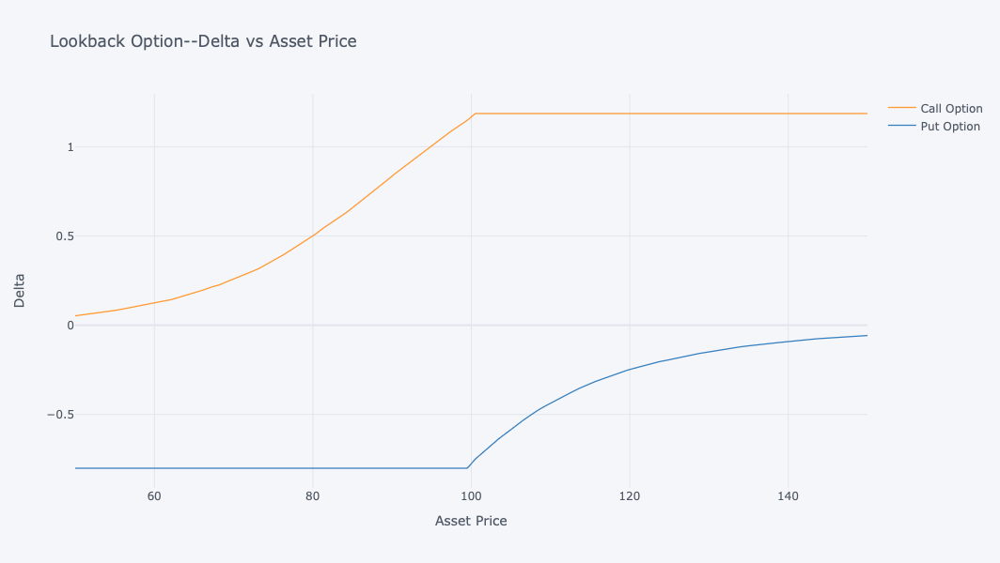

In [330]:
delta=delta.set_index(S0)
delta.iplot(x=[delta.index], title='Lookback Option--Delta vs Asset Price', xTitle='Asset Price', yTitle='Delta')

**Gamma**

In [331]:
# Parameter setting
S0, E, r, T, sigma, process, mu, std, D, ts, num=np.linspace(50,150, 100), 100, 0.05, 1, 0.2, 'stochastic volatility', 0.4, 0.7, 0.0, 252, 10000

gamma =[]
for s in S0:
    gamma.append( Greeks(s,E, r, T, sigma, 'lookback', dic_lookback, process, mu, std, D, ts, num).gamma(0.7))

gamma = pd.DataFrame(gamma, columns=['Call Option', 'Put Option'])
gamma.head()

,Call Option,Put Option
0,0.004116,-1.450087e-14
1,0.005420,2.900174e-14
2,0.004485,0.000000e+00
3,0.006857,-1.450087e-14
4,0.006614,0.000000e+00


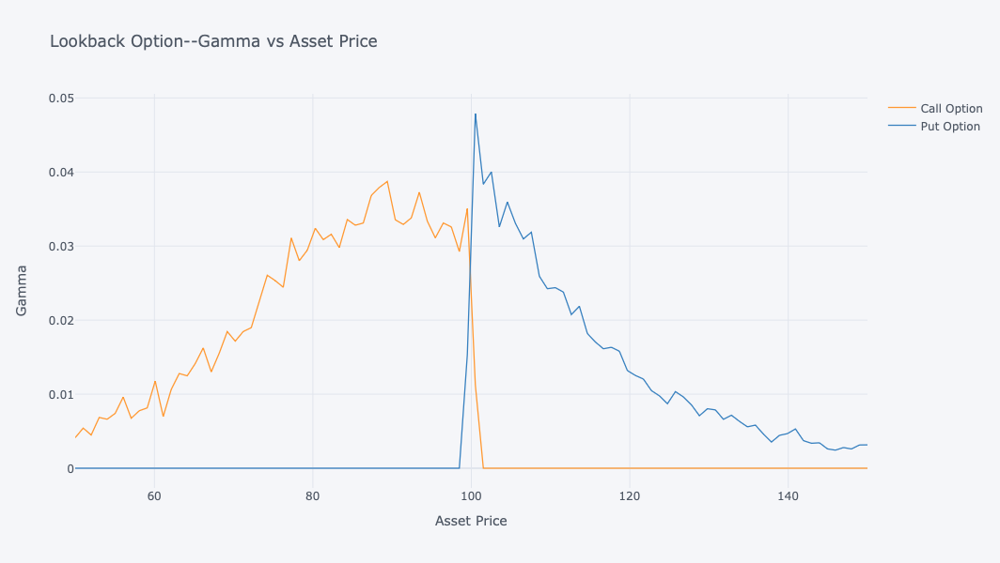

In [332]:
gamma=gamma.set_index(S0)
gamma.iplot(x=[gamma.index], title='Lookback Option--Gamma vs Asset Price', xTitle='Asset Price', yTitle='Gamma')

**Vega**

In [333]:
# Parameter setting
S0, E, r, T, sigma, process, mu, std, D, ts, num=100, 100, 0.05, 1, np.linspace(0.0,0.9, 100) , 'stochastic volatility', 0.4, 0.7, 0.0, 252, 10000

vega =[]
for si in sigma:
    vega.append( Greeks(S0, E, r, T,si, 'lookback', dic_lookback, process, mu, std, D, ts, num).vega())

vega = pd.DataFrame(vega, columns=['Call Option', 'Put Option'])
vega.head()

,Call Option,Put Option
0,0.572888,0.111239
1,34.919948,22.990123
2,58.244025,48.519549
3,72.177070,65.722770
4,81.094815,74.440204


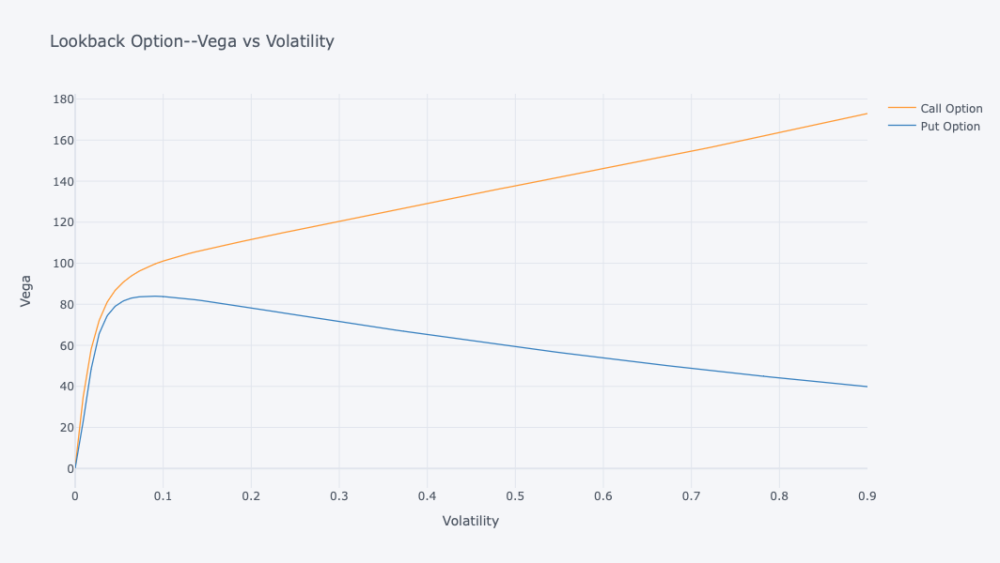

In [334]:
vega=vega.set_index(sigma)
vega.iplot(x=[vega.index], title='Lookback Option--Vega vs Volatility', xTitle='Volatility', yTitle='Vega')

**Rho**

In [335]:
# Parameter setting
S0, E, r, T, sigma, process, mu, std, D, ts, num=100, 100, np.linspace(0.01, 0.08, 100), 1, 0.2 , 'stochastic volatility', 0.4, 0.7, 0.0, 252, 10000

rho =[]
for rate in r:
    rho.append( Greeks(S0, E, rate, T,sigma, 'lookback', dic_lookback, process, mu, std, D, ts, num).rho())
rho = pd.DataFrame(rho, columns=['Call Option', 'Put Option'])
rho.head()

,Call Option,Put Option
0,42.746796,-58.159084
1,42.801766,-58.028964
2,42.855484,-57.898668
3,42.907715,-57.768784
4,42.959921,-57.637160


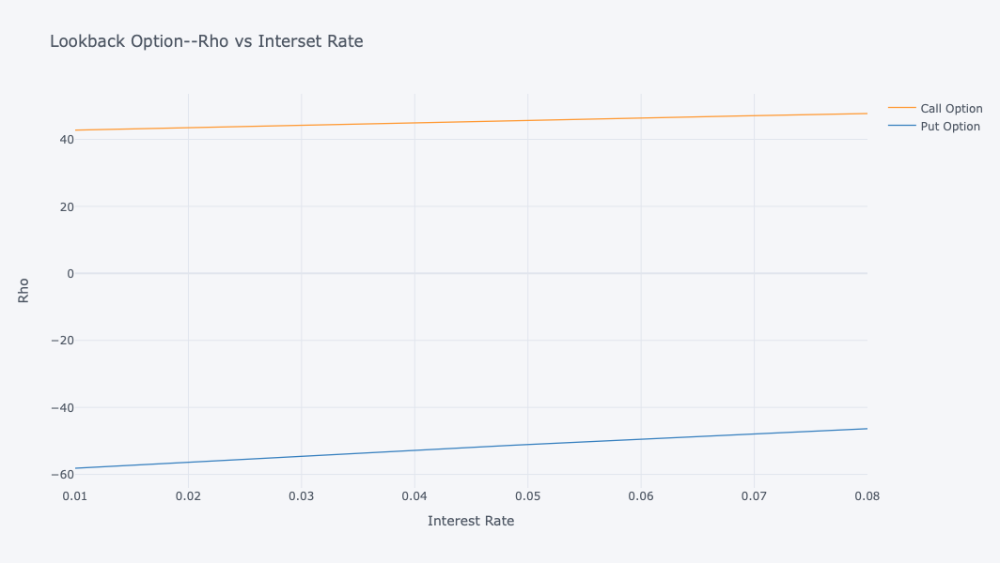

In [336]:
rho=rho.set_index(r)
rho.iplot(x=[rho.index], title='Lookback Option--Rho vs Interset Rate', xTitle='Interest Rate', yTitle='Rho')

**Theta**

In [337]:
# Parameter setting
S0, E, r, T, sigma, process, mu, std, D, ts, num=100, 100, 0.05, 1, 0.2 , 'stochastic volatility', 0.4, 0.7, 0.0, 252, 10000

time = np.linspace(0, T, ts)
asian_theta =[]
for t in time:
    asian_theta.append( Greeks(S0, E, r, T,sigma, 'lookback', dic_lookback, process, mu, std, D, ts, num).lookback_theta(t))

asian_theta = pd.DataFrame(asian_theta, columns=['Call Option', 'Put Option'])
asian_theta.head()

,Call Option,Put Option
0,-18.432136,-8.136372
1,-18.432347,-8.133908
2,-18.420305,-8.144933
3,-18.408531,-8.156032
4,-18.397116,-8.167472


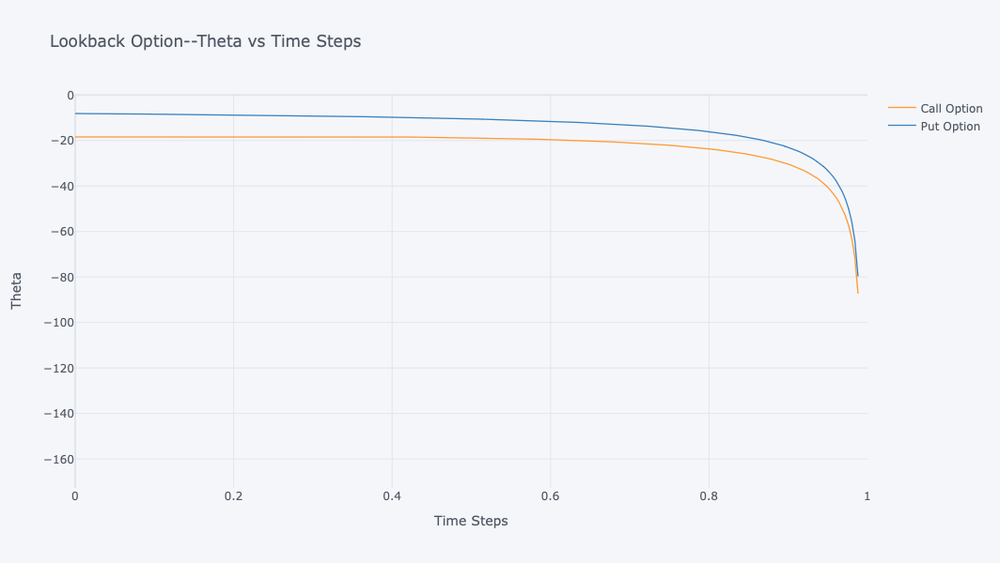

In [338]:
asian_theta=asian_theta.set_index(time)
asian_theta.iplot(x=[asian_theta.index], title='Lookback Option--Theta vs Time Steps', xTitle='Time Steps', yTitle='Theta')

## 3. Conclusion

1. **Asion Option**

In [339]:
asion_lognormal = pd.DataFrame(data1,columns=['Combinations', 'Call price', 'Put price']).set_index('Combinations')
asion_normal = pd.DataFrame(data2,columns=['Combinations', 'Call price', 'Put price']).set_index('Combinations')
asion_stochastic = pd.DataFrame(data3,columns=['Combinations', 'Call price', 'Put price']).set_index('Combinations')
asion_com = pd.concat([asion_lognormal, asion_normal, asion_stochastic], 
                             axis=1, keys=['Lognormal', 'Normal', 'Lognormal and Stochastic Volatility'])
asion_com

Lognormal                      \
                                        Call price           Put price   
Combinations                                                             
rate continuous arithmetic 5     5.827577481651353  3.2187379248113412   
rate continuous geometric 5      5.611425772623954   3.335114641564607   
rate discrete arithmetic 5      5.7962670475948315  3.1975722064421226   
rate discrete geometric 5       5.5776025992255125   3.315368494395188   
strike continuous arithmetic 5    5.86830701624676  3.4029871339322533   
strike continuous geometric 5     6.07590413035131  3.2780558222561393   
strike discrete arithmetic 5        5.873860038403   3.398395440401191   
strike discrete geometric 5      6.084257152032594     3.2723318177084   

                                            Normal                      \
                                        Call price           Put price   
Combinations                                                             
rate continuous arithmetic 5     5.827908394750011  3.2180904561641683   
rate continuous geometric 5      5.611952553285162  3.3345931400470428   
rate discrete arithmetic 5       5.796657546903814  3.1969965755304113   
rate discrete geometric 5        5.578103865818266  3.3148331452144704   
strike continuous arithmetic 5   5.868552534271332   3.401881212257619   
strike continuous geometric 5   6.0760472753394525  3.2769174279780158   
strike discrete arithmetic 5     5.874114578402092    3.39728628917594   
strike discrete geometric 5      6.084395691593747   3.271177151597986   

                               Lognormal and Stochastic Volatility  \
                                                        Call price   
Combinations                                                         
rate continuous arithmetic 5                     6.367543853004719   
rate continuous geometric 5                      5.987747708284161   
rate discrete arithmetic 5                       6.336214200832616   
rate discrete geometric 5                        5.952864155389206   
strike continuous arithmetic 5                   7.528200386319953   
strike continuous geometric 5                    7.876584000634193   
strike discrete arithmetic 5                     7.529851721825696   
strike discrete geometric 5                      7.882160379489785   

                                                    
                                         Put price  
Combinations                                        
rate continuous arithmetic 5    3.9603581114224258  
rate continuous geometric 5      4.220716751525736  
rate discrete arithmetic 5       3.938556544401963  
rate discrete geometric 5        4.201559030839097  
strike continuous arithmetic 5   5.136014666225377  
strike continuous geometric 5    4.844243495715749  
strike discrete arithmetic 5     5.128137916579482  
strike discrete geometric 5      4.834094042363024

**Lookback Option**

In [340]:
lookback_lognormal = pd.DataFrame(data4,columns=['Combinations', 'Call price', 'Put price']).set_index('Combinations')
lookback_normal = pd.DataFrame(data5,columns=['Combinations', 'Call price', 'Put price']).set_index('Combinations')
lookback_stochastic = pd.DataFrame(data6,columns=['Combinations', 'Call price', 'Put price']).set_index('Combinations')
lookback_com = pd.concat([lookback_lognormal, lookback_normal, lookback_stochastic], 
                             axis=1, keys=['Lognormal', 'Normal', 'Lognormal and Stochastic Volatility'])
lookback_com

Lognormal                      \
                               Call price           Put price   
Combinations                                                    
fixed continuous 5      18.47166554338252  11.514174900409284   
fixed discrete 5       17.465534476332827   10.80545057103018   
floating continuous 5  16.588334339563808  13.397506104228004   
floating discrete 5     15.91559448546199  12.467905092796054   

                                   Normal                      \
                               Call price           Put price   
Combinations                                                    
fixed continuous 5     18.472773502906605  11.512868114738572   
fixed discrete 5       17.466155929342285   10.80439110506139   
floating continuous 5   16.58935737533813   13.39628424230705   
floating discrete 5    15.916752809176058   12.46616674915463   

                      Lognormal and Stochastic Volatility                      
                                               Call price           Put price  
Combinations                                                                   
fixed continuous 5                      23.46898031920093   14.97695403440771  
fixed discrete 5                       21.928682794020805  14.050180483145372  
floating continuous 5                  19.776325496084578  18.669608857524068  
floating discrete 5                     18.91743746766682  17.268538174083712

For asian options, the rate is overall higher than the strike. An asymmetry effect between call and put options implies an asymmetric risk. This also applies to lookback options. From a profit perspective, lookback options are superior to Asian options. However, in terms of risk management, asian options can mitigate the adverse effects of underlying volatility. Therefore, in hedging strategies, it's crucial to consider asymmetric effects.

Lognormal and normal processes have similar effects, but overlaying stochastic volatility significantly alters option values. Asset volatility is a critical factor that cannot be ignored. How to fit the volatility is essential in the real world. These methods are all about pricing in a risk-neutral world, and applying measure transformation theory to guide real-world trading is necessary.

2. **Greeks**

Using **control variates**, to observe the impact of a single variable on option value, with linear and non-linear relationships. However, the Greeks are better at demonstrating inherent relationships. In the Black-Scholes world, first-order derivatives reflect change rates, leading to more accurate decision-making. Calculating Greeks using the Monte Carlo method is difficult, especially in solving second-order derivatives (using forward, backward, and central differences). There is the effect of the choice of intervals on the final calculation results, necessitating algorithm improvements and demonstrating algorithm convergence.

Financial problems are diverse, and how to effectively utilize mathematical tools is an ongoing exploration, corresponding 
mathematical and physical models. Maintaining curiosity and a desire to explore is crucial to effectively solving core problems.

# Reference

- [1] Paul Wilmott on Quantitative Finance Volume 2, Paul Wilmott, John Wiley & Sons Ltd.
- [2] Paul Wilmott on Quantitative Finance Volume 3, Paul Wilmott, John Wiley & Sons Ltd.
- [3] Paul Wilmott introduces Quantitative Finance, Paul Wilmott (2007), John Wiley & Sons Ltd.
- [4] Python for Finance, Yves Hilpisch, O'Reilly Media, Inc.
- [5] Monte Carlo methods in finance, Peter j$\ddot{a}$ckel, John Wiley & Sons Ltd.
- [6] CQF Course M3 L1 - The Black–Scholes Model
- [7] CQF Course M3 L2 - Martingales Theory Application to Option Pricing
- [8] CQF Course M3 L3 - Martingales and PDEs Which When and Why
- [9] CQF Course M3 L4 - Introduction to Numerical Method
- [10] CQF Course M3 L5 - Exotic Options
- [11] CQF Course M3 L6 - Understanding Volatility
- [12] CQF Python Labs - Monte Carlo Option Pricing
- [13] CQF Python Labs - Black Scholes Option Pricing 